In [1]:
#Continue from scRNAseq_GEO_preprocessing_Step0_140924.ipynb

import scanpy as sc
import pandas as pd
import os

#Define the directory where the files are located
data_dir = os.path.expanduser("~/DFCI_projects/HDAC1_analysis/scRNAseq_analysis_Nature/NEBC_Shalek_analysis/")

In [2]:
#File mapping: (GEO accession, treatment, replicate in file)
samples = {
    "GSM6481232": ("DMSO", "A", "rep1"),
    "GSM6481233": ("DMSO", "B", "rep2"),
    "GSM6481234": ("TSA", "A", "rep1"),
    "GSM6481235": ("TSA_2_reWTA", "B", "rep2"),  #Special case for GSM6481235
    "GSM6481236": ("E6R", "A", "rep1"),
    "GSM6481237": ("E6R", "B", "rep2")
}

#Initialize a list to store AnnData objects
adatas = []

#Loop over samples and read each dataset:
#We need to navigate to feature, barcode & matrix files per subfolder. 
for sample_id, (treatment, file_rep, metadata_rep) in samples.items():
    print(f"\nProcessing Sample ID: {sample_id}, Treatment: {treatment}, Replicate: {file_rep}")
    
    #Subdirectory for the sample
    sample_dir = os.path.join(data_dir, f"{sample_id}_Neuro_{treatment}_{file_rep}")
    
    #File paths: Handling the special case for GSM6481235 (as it doesn't have the _B suffix) 
    if sample_id == "GSM6481235":
        barcodes_path = os.path.join(sample_dir, f"{sample_id}_Neuro_TSA_2_reWTA_barcodes.tsv.gz")
        features_path = os.path.join(sample_dir, f"{sample_id}_Neuro_TSA_2_reWTA_features.tsv.gz")
        matrix_path = os.path.join(sample_dir, f"{sample_id}_Neuro_TSA_2_reWTA_matrix.mtx.gz")
    else:
        barcodes_path = os.path.join(sample_dir, f"{sample_id}_Neuro_{treatment}_{file_rep}_barcodes.tsv.gz")
        features_path = os.path.join(sample_dir, f"{sample_id}_Neuro_{treatment}_{file_rep}_features.tsv.gz")
        matrix_path = os.path.join(sample_dir, f"{sample_id}_Neuro_{treatment}_{file_rep}_matrix.mtx.gz")
    
    #Read the matrix and transpose it to align cells and genes
    matrix = sc.read_mtx(matrix_path).X.T  # Transpose matrix to match cells and genes
    
    #Load barcodes and features (gene names)
    features = pd.read_csv(features_path, header=None, sep='\t')[1].values  # Get gene names
    barcodes = pd.read_csv(barcodes_path, header=None, sep='\t')[0].values  # Get barcodes (cells)

    #Check the dimensions again after transposition
    if matrix.shape[0] != len(barcodes):
        raise ValueError(f"Number of barcodes ({len(barcodes)}) does not match the number of cells ({matrix.shape[0]}) in the matrix for {sample_id}")
    
    if matrix.shape[1] != len(features):
        raise ValueError(f"Number of features ({len(features)}) does not match the number of variables ({matrix.shape[1]}) in the matrix for {sample_id}")
    
    #Create an AnnData object with the matrix
    adata = sc.AnnData(X=matrix)
    
    #Assign the barcodes and features to the AnnData object
    adata.var_names = features
    adata.obs_names = barcodes
    
    #Make var_names and obs_names unique in case of duplicate. 
    adata.var_names_make_unique()
    adata.obs_names_make_unique()

    # Add metadata to the AnnData object
    adata.obs['treatment'] = treatment
    adata.obs['replicate'] = metadata_rep  # Using rep1 and rep2 for metadata
    adata.obs['sample_id'] = sample_id
    
    # Append the AnnData object to the list
    adatas.append(adata)

#Concatenate all AnnData objects
adata_merged = adatas[0].concatenate(adatas[1:], batch_key="sample_id", batch_categories=list(samples.keys()))

#Show the merged data structure
print(adata_merged)


Processing Sample ID: GSM6481232, Treatment: DMSO, Replicate: A

Processing Sample ID: GSM6481233, Treatment: DMSO, Replicate: B

Processing Sample ID: GSM6481234, Treatment: TSA, Replicate: A

Processing Sample ID: GSM6481235, Treatment: TSA_2_reWTA, Replicate: B

Processing Sample ID: GSM6481236, Treatment: E6R, Replicate: A

Processing Sample ID: GSM6481237, Treatment: E6R, Replicate: B


/tmp/ipykernel_21117/1154346554.py:66: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = adatas[0].concatenate(adatas[1:], batch_key="sample_id", batch_categories=list(samples.keys()))


AnnData object with n_obs × n_vars = 90306 × 36601
    obs: 'treatment', 'replicate', 'sample_id'


In [3]:
#Print #cells per sample ID
#Technical replicates are included 
print(adata_merged.obs['sample_id'].value_counts()) 
print(adata_merged.obs['replicate'].value_counts()) 
print(adata_merged.obs['treatment'].value_counts())

sample_id
GSM6481236    15123
GSM6481234    15054
GSM6481233    15051
GSM6481237    15036
GSM6481232    15033
GSM6481235    15009
Name: count, dtype: int64
replicate
rep1    45210
rep2    45096
Name: count, dtype: int64
treatment
E6R            30159
DMSO           30084
TSA            15054
TSA_2_reWTA    15009
Name: count, dtype: int64


In [4]:
#Calculate the total counts per cell (UMIs per cell)
adata_merged.obs['total_counts'] = adata_merged.X.sum(axis=1)

#Calculate the number of genes expressed in each cell
adata_merged.obs['n_genes_by_counts'] = (adata_merged.X > 0).sum(axis=1)

#Calculate mitochondrial gene content (if not already done)
adata_merged.var['mt'] = adata_merged.var_names.str.startswith('MT-')
adata_merged.obs['percent_mt'] = adata_merged[:, adata_merged.var['mt']].X.sum(1) / adata_merged.X.sum(1)


#Calculate the median of each metric
median_n_genes = adata_merged.obs['n_genes_by_counts'].median()
median_total_counts = adata_merged.obs['total_counts'].median()
median_percent_mt = adata_merged.obs['percent_mt'].median()

#Print the median values
print(f"Median number of genes: {median_n_genes}")
print(f"Median total UMI counts: {median_total_counts}")
print(f"Median percentage of mitochondrial content: {median_percent_mt}") 

Median number of genes: 210.0
Median total UMI counts: 248.0
Median percentage of mitochondrial content: 0.05988023802638054


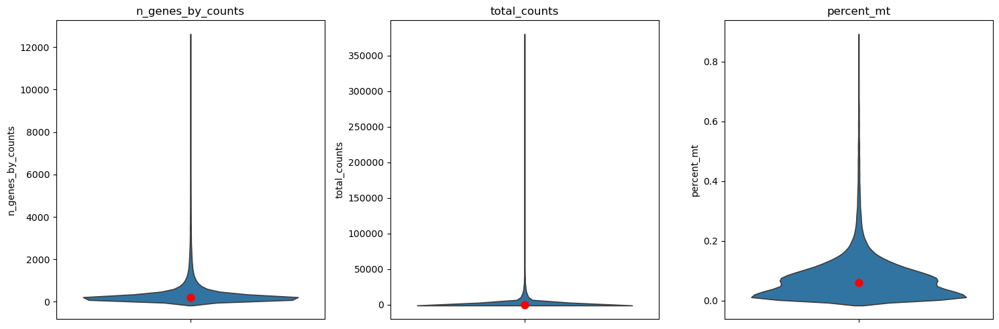

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

#Prepare the data for plotting
metrics = ['n_genes_by_counts', 'total_counts', 'percent_mt']
adata_df = adata_merged.obs[metrics]

#Create the violin plot with seaborn, highlighting the median
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, metric in enumerate(metrics):
    sns.violinplot(data=adata_df, y=metric, ax=axes[i], inner=None)
    sns.pointplot(data=adata_df, y=metric, ax=axes[i], estimator='median', color='red', markers='o')
    axes[i].set_title(f"{metric}")

plt.tight_layout()
plt.show()

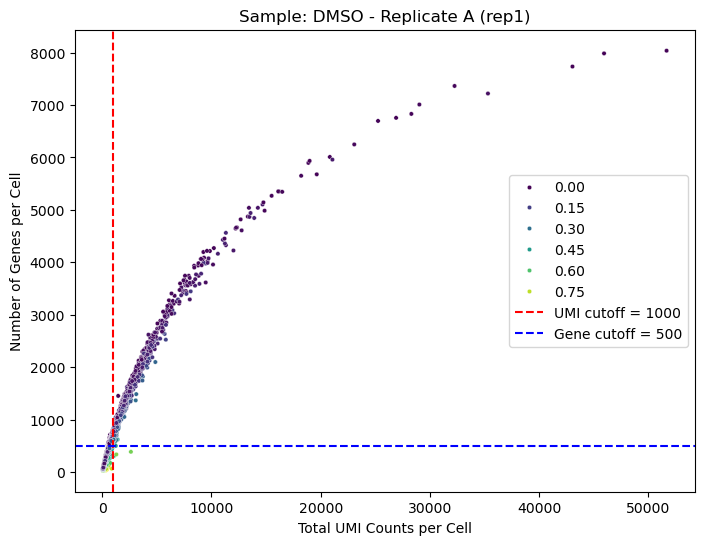

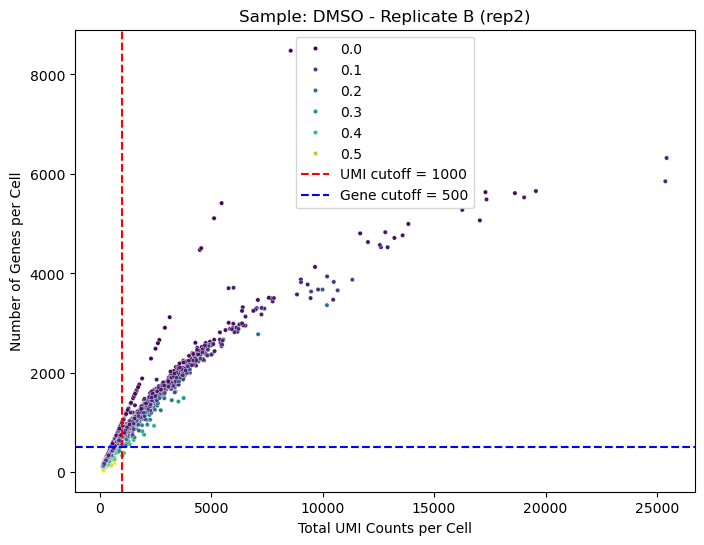

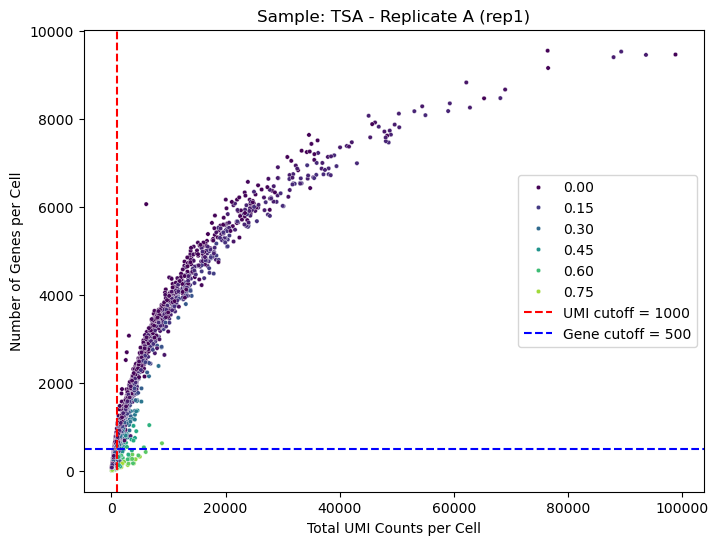

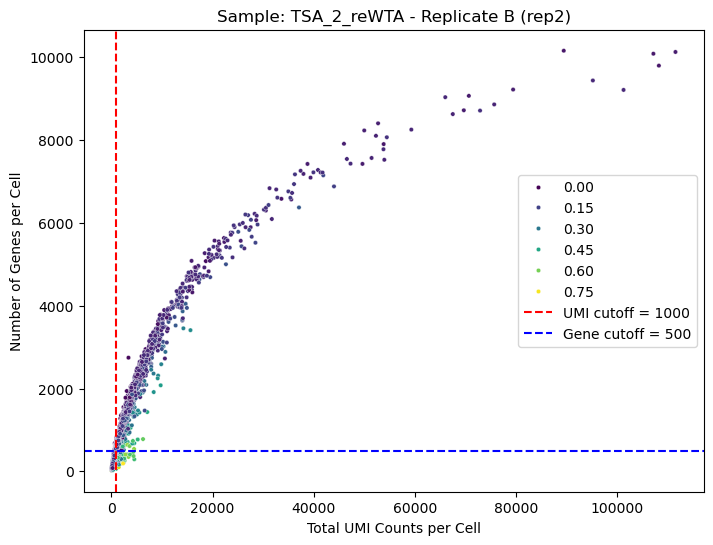

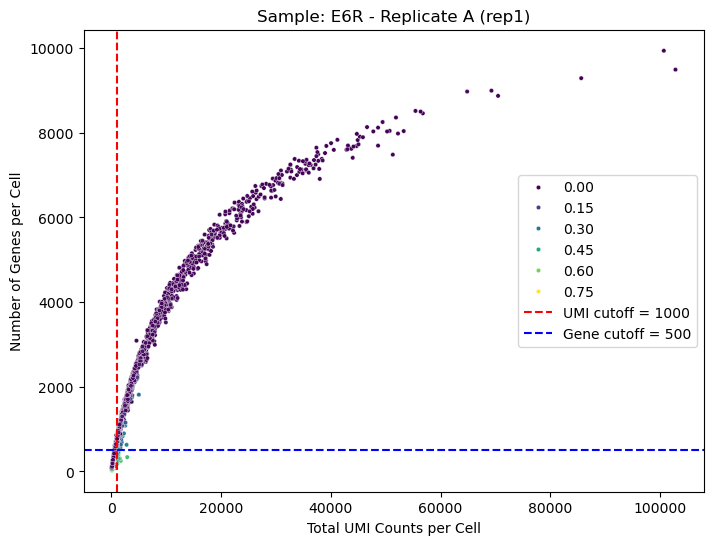

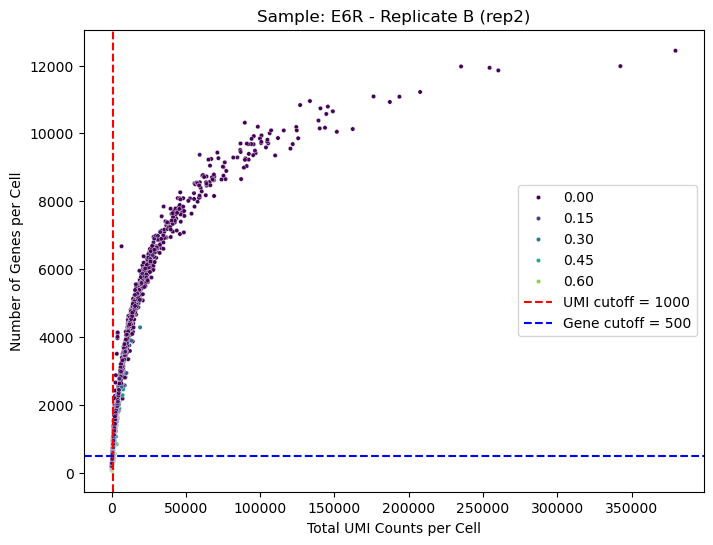

In [6]:
#Define cutoffs for genes & UMIs
gene_cutoff = 500  #Gene count threshold
umi_cutoff = 1000  #UMI count threshold => would filter out most of the cells as we're dealing with Seq-Well

#Set lower bounds for UMI counts & gene counts, but be cautious with upper bounds. 
#Might need to use more lenient thresholds due to Seq-Well’s lower gene detection sensitivity compared to 10X V3 (please talk to Alex) 

#Dictionary to map sample IDs to names and replicates
samples = {
    "GSM6481232": ("DMSO", "A", "rep1"),
    "GSM6481233": ("DMSO", "B", "rep2"),
    "GSM6481234": ("TSA", "A", "rep1"),
    "GSM6481235": ("TSA_2_reWTA", "B", "rep2"),
    "GSM6481236": ("E6R", "A", "rep1"),
    "GSM6481237": ("E6R", "B", "rep2")
}


#Loop through each sample & create a joint plot
for sample_id, (treatment, replicate, rep_number) in samples.items():
    
    #Subset data by sample
    adata_sample = adata_merged[adata_merged.obs['sample_id'] == sample_id]
    
    #Extract relevant columns
    umi_counts = adata_sample.obs['total_counts']
    gene_counts = adata_sample.obs['n_genes_by_counts']
    mt_percent = adata_sample.obs['percent_mt']
    
    #Create the scatter plot for the sample
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=umi_counts, y=gene_counts, hue=mt_percent, palette="viridis", s=10)
    
    #Add cutoff lines for UMIs & genes
    plt.axvline(x=umi_cutoff, color='red', linestyle='--', label=f"UMI cutoff = {umi_cutoff}")
    plt.axhline(y=gene_cutoff, color='blue', linestyle='--', label=f"Gene cutoff = {gene_cutoff}")
    
    #Add labels & title
    plt.xlabel("Total UMI Counts per Cell")
    plt.ylabel("Number of Genes per Cell")
    plt.title(f"Sample: {treatment} - Replicate {replicate} ({rep_number})")
    plt.legend()
    
    #Show the plot for the current sample
    plt.show()

#Joint plot: divide the plot into four quadrants. The lower left is "low UMI, low genes" & denotes poor quality cells
#Mostly these cells have relatively more %MT-transcript content & should be filtered out. 

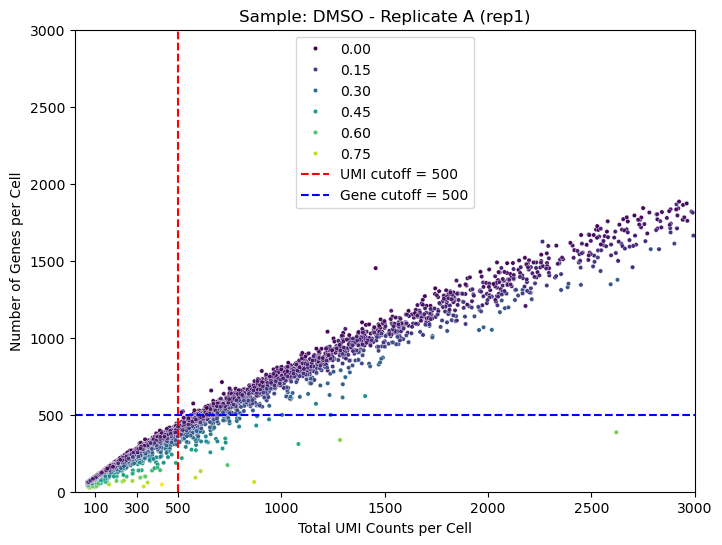

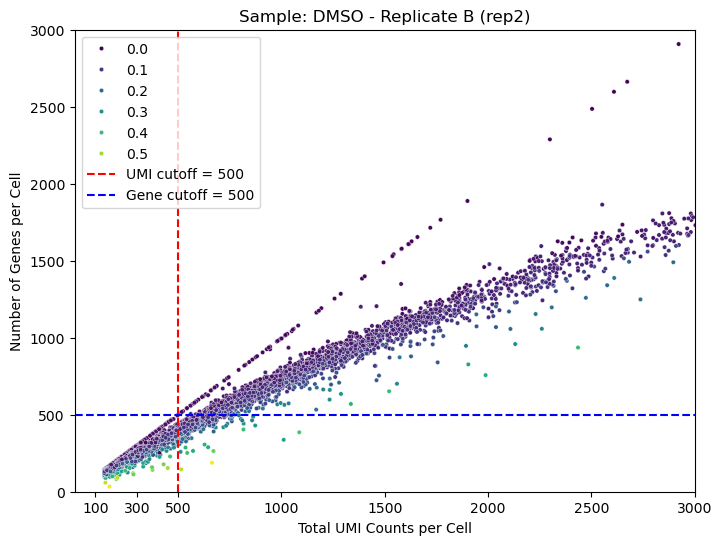

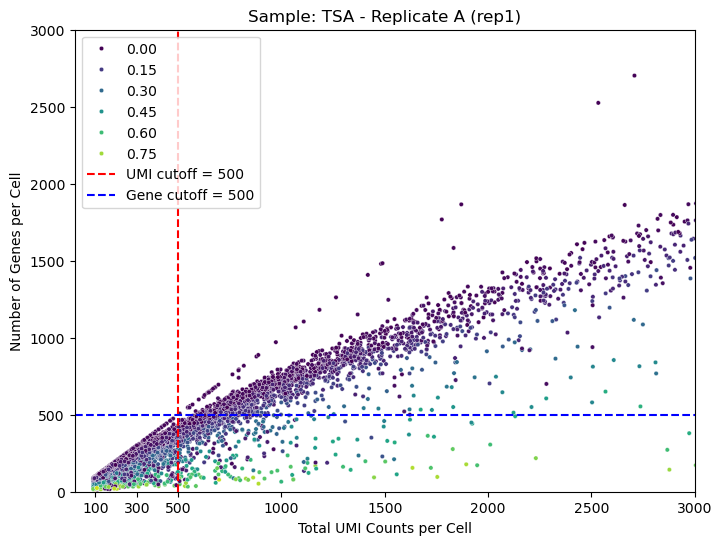

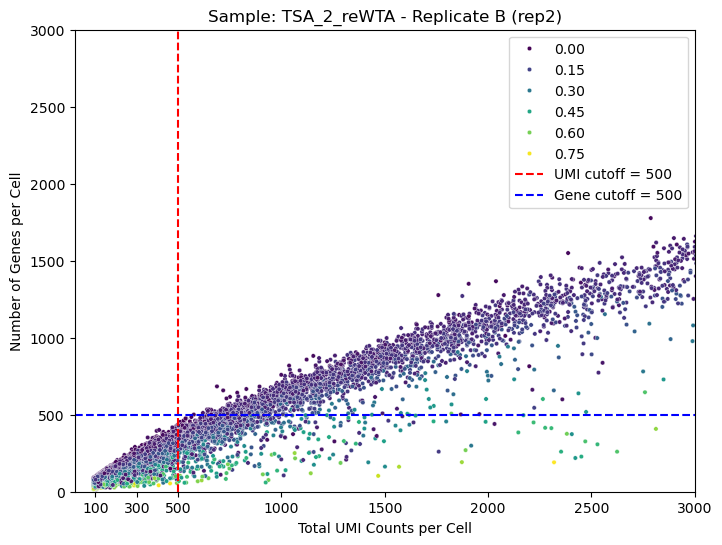

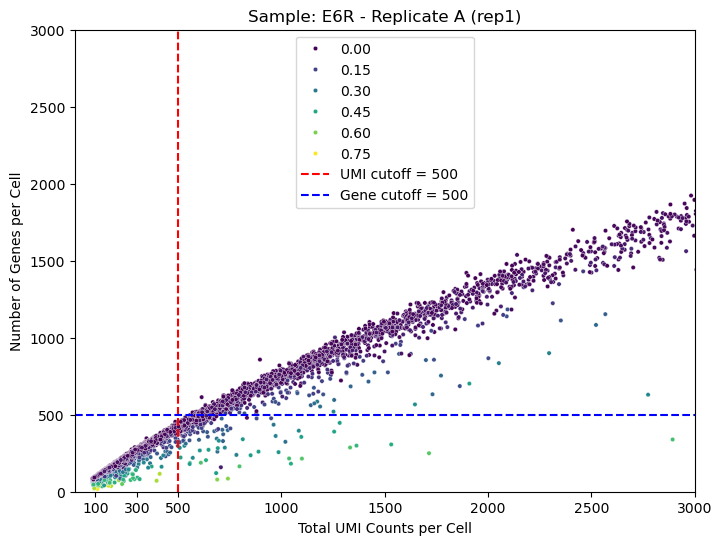

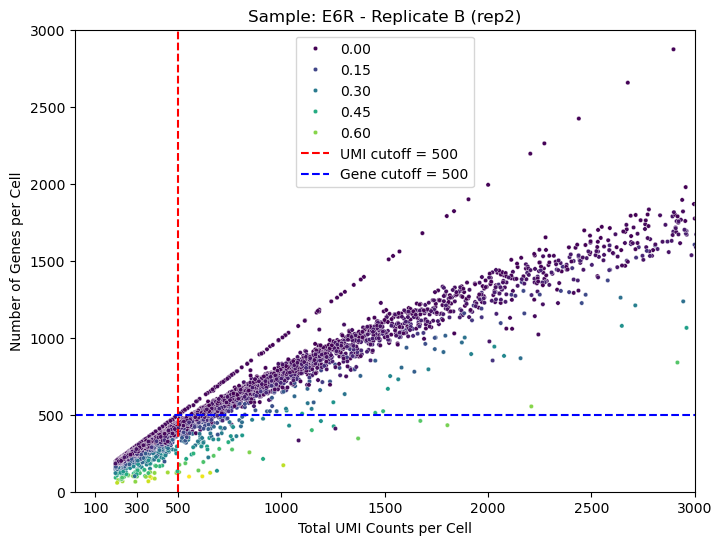

In [7]:
#Define cutoffs for genes & UMIs
gene_cutoff = 500  #Gene count threshold
umi_cutoff = 500  #UMI count threshold- reduced to 500 now. 

#Set consistent x & y axis limits
x_limits = [0, 2000]  
y_limits = [0, 3000]

#Set tick marks for the x-axis (UMI counts)
#Given we're dealing with a pretty low complexity sample (as opposed to 10X)
umi_ticks = [100, 300, 500, 1000, 1500, 2000, 2500, 3000]

#Dictionary to map sample IDs to names & replicates
samples = {
    "GSM6481232": ("DMSO", "A", "rep1"),
    "GSM6481233": ("DMSO", "B", "rep2"),
    "GSM6481234": ("TSA", "A", "rep1"),
    "GSM6481235": ("TSA_2_reWTA", "B", "rep2"),
    "GSM6481236": ("E6R", "A", "rep1"),
    "GSM6481237": ("E6R", "B", "rep2")
}

#Loop through each sample & create a joint plot
for sample_id, (treatment, replicate, rep_number) in samples.items():
    
    #Subset data by sample
    adata_sample = adata_merged[adata_merged.obs['sample_id'] == sample_id]
    
    #Extract relevant columns
    umi_counts = adata_sample.obs['total_counts']
    gene_counts = adata_sample.obs['n_genes_by_counts']
    mt_percent = adata_sample.obs['percent_mt']
    
    #Create the scatter plot for the sample
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=umi_counts, y=gene_counts, hue=mt_percent, palette="viridis", s=10)
    
    #Add cutoff lines for UMIs & genes
    plt.axvline(x=umi_cutoff, color='red', linestyle='--', label=f"UMI cutoff = {umi_cutoff}")
    plt.axhline(y=gene_cutoff, color='blue', linestyle='--', label=f"Gene cutoff = {gene_cutoff}")
    
    #Set the x & y axis limits
    plt.xlim(x_limits)
    plt.ylim(y_limits)
    
    #Set tick marks for the x-axis (UMI counts)
    plt.xticks(umi_ticks)
    
    #Add labels & title
    plt.xlabel("Total UMI Counts per Cell")
    plt.ylabel("Number of Genes per Cell")
    plt.title(f"Sample: {treatment} - Replicate {replicate} ({rep_number})")
    plt.legend()
    
    #Show the plot for the current sample
    plt.show()

#We want to zoom into the low UMI region from 100 to 500. Technically, most low quality cells reside there.

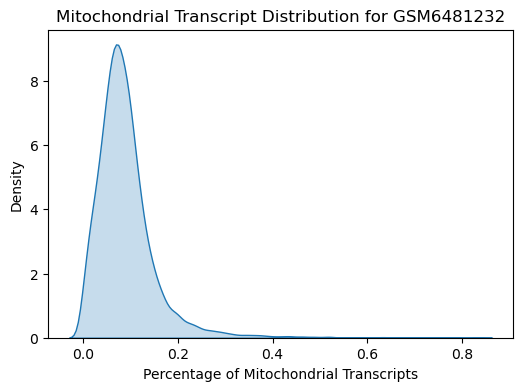

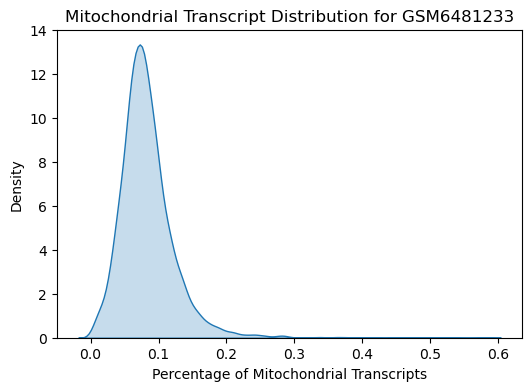

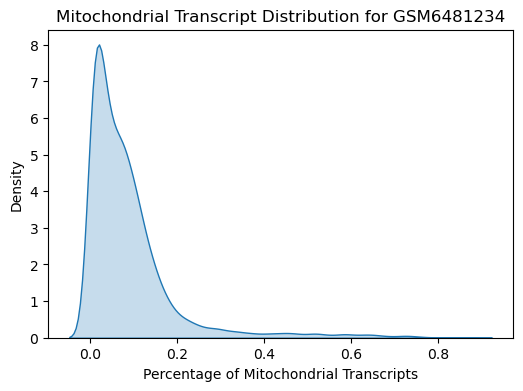

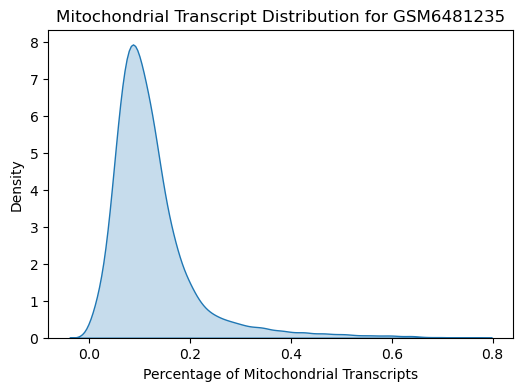

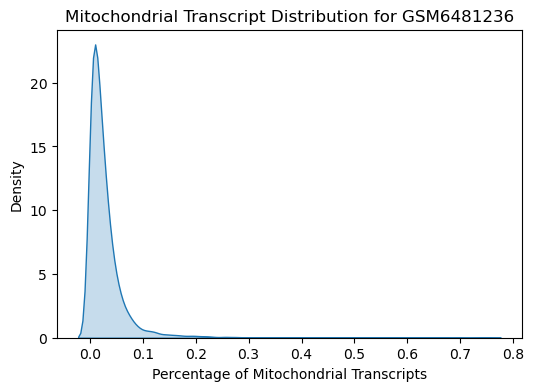

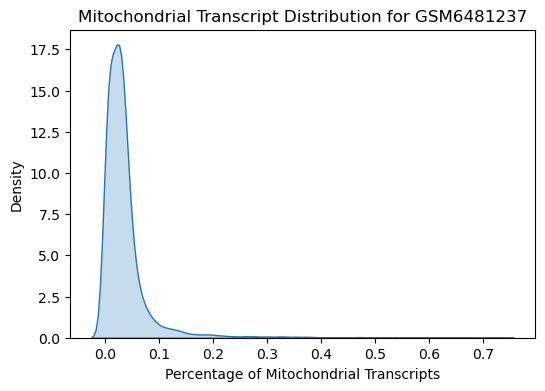

In [8]:
#Loop through each sample & plot the KDE (kernel density estimation) for pct_counts_mt
for sample_id in adata_merged.obs['sample_id'].unique():
    #Filter the data for the current sample
    sample_data = adata_merged[adata_merged.obs['sample_id'] == sample_id]
    
    #Create the KDE plot
    plt.figure(figsize=(6, 4))
    sns.kdeplot(sample_data.obs['percent_mt'], fill=True)
    
    #Add title/labels
    plt.title(f'Mitochondrial Transcript Distribution for {sample_id}')
    plt.xlabel('Percentage of Mitochondrial Transcripts')
    plt.ylabel('Density')
    
    #Show plot
    plt.show()

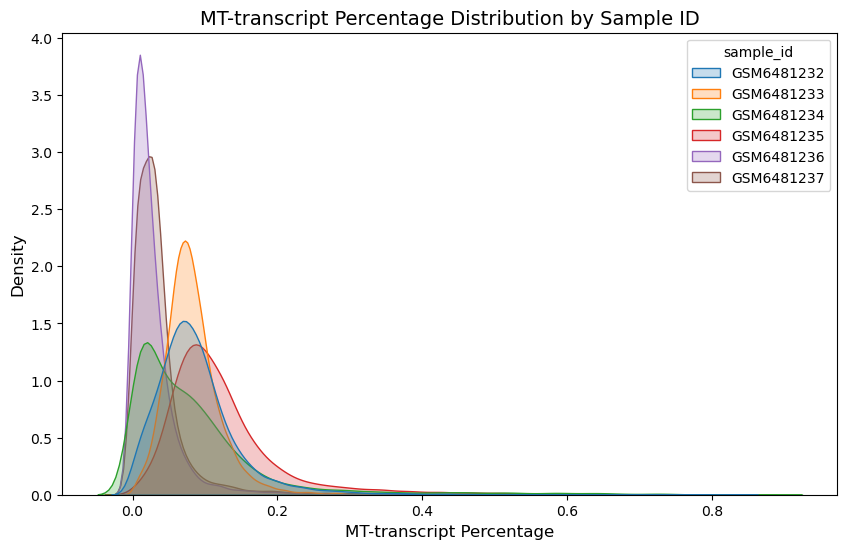

In [9]:
#Create a new dataframe for plotting that includes the MT percentages and Sample ID information
mt_percentages = adata_merged.obs[['percent_mt', 'sample_id']]

# Set the style for seaborn
#sns.set(style="whitegrid")

# Create a KDE plot for the MT-transcript percentage by Sample ID
plt.figure(figsize=(10, 6))
sns.kdeplot(data=mt_percentages, x= "percent_mt", hue="sample_id", fill=True)

# Add labels and title
plt.title("MT-transcript Percentage Distribution by Sample ID", fontsize=14)
plt.xlabel("MT-transcript Percentage", fontsize=12)
plt.ylabel("Density", fontsize=12)

# Show plot
plt.show()

In [10]:
#Copy the treatment column to a new column treatment02
adata_merged.obs['treatment02'] = adata_merged.obs['treatment'].copy()

#Replace 'TSA_2_reWTA' with 'TSA' in the new treatment02 column
adata_merged.obs['treatment02'].replace("TSA_2_reWTA", "TSA", inplace=True)

/tmp/ipykernel_21117/3264498232.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata_merged.obs['treatment02'].replace("TSA_2_reWTA", "TSA", inplace=True)


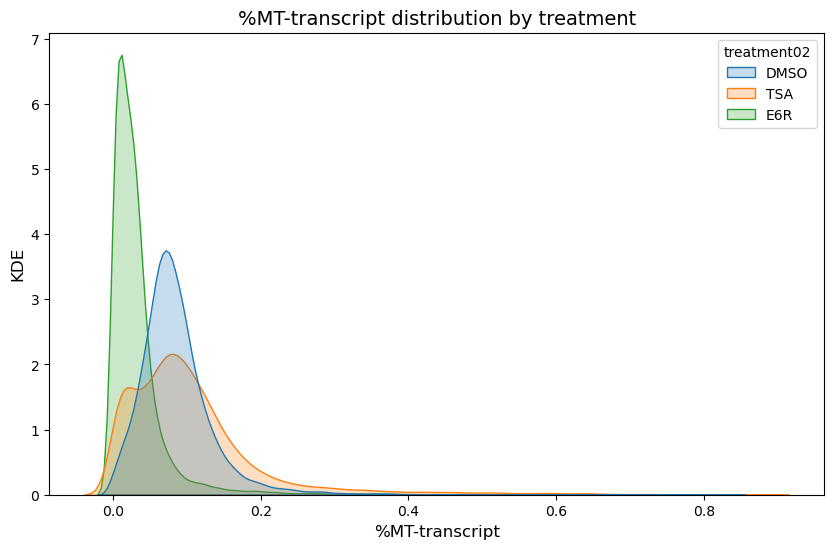

In [11]:
#Create a new dataframe for plotting that includes the %MT & treatment labels: 
mt_percentages = adata_merged.obs[['percent_mt', 'treatment02']]

#Set the style for seaborn
#sns.set(style="whitegrid")

#Create a KDE plot for the MT-transcript percentage by treatment02
plt.figure(figsize=(10, 6))
sns.kdeplot(data=mt_percentages, x= "percent_mt", hue="treatment02", fill=True)


plt.title("%MT-transcript distribution by treatment", fontsize=14)
plt.xlabel("%MT-transcript", fontsize=12)
plt.ylabel("KDE", fontsize=12)
plt.show()

In [12]:
#mitochondrial genes
adata_merged.var["mt"] = adata_merged.var_names.str.startswith("MT-")

#ribosomal genes
adata_merged.var["ribo"] = adata_merged.var_names.str.startswith(("RPS", "RPL"))

#hemoglobin genes.
adata_merged.var["hb"] = adata_merged.var_names.str.contains(("^HB[^(P)]"))

sc.pp.calculate_qc_metrics(adata_merged, qc_vars=["mt", "ribo", "hb"], 
                           inplace=True, percent_top=[20], 
                           log1p=True)

adata_merged #We've 90,306 cells pre-filtering 

#Discussed with Alex/Josh about raw CellRanger files & ambient RNAs => no Cellbender background correction required due to lack of confounding factors.  
#However, what is the expected ambient RNA distribution profile for Seq-well? Do we really need correction? 

AnnData object with n_obs × n_vars = 90306 × 36601
    obs: 'treatment', 'replicate', 'sample_id', 'total_counts', 'n_genes_by_counts', 'percent_mt', 'treatment02', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

Notes on ambient RNA in Seq-Well:

- Microwell-based platforms: Seq-Well captures single cells in microwells, which are pre-loaded with barcoded beads. Unlike droplet-based technologies (e.g., 10X), ambient RNA contamination in Seq-Well tends to be lower due to the physical isolation of cells during capture. Droplet-based methods tend to have more significant ambient RNA contamination because free-floating RNA can be encapsulated with cells during droplet formation.

- Lysis of single cells: Ambient RNA contamination in Seq-Well is mainly introduced during the cell lysis phase, as any RNA from lysed cells that doesn’t fully hybridize to beads may contaminate neighboring wells. However, the risk is lower than in droplet-based methods since cells are physically constrained to microwells.

- Low UMI & Gene Count: Ambient RNA contamination in Seq-Well will typically show up as cells with low UMI counts & low gene counts, often with a higher percentage of mitochondrial transcripts and non-cellular RNAs. These might appear as empty droplets in droplet-based systems, but in Seq-Well, they're often cells with very low RNA content. We investigated this effect using the above Joint Plots & subsequently I made several case studies of QC. We see that even default filtering steps (that work well for 10X) is removed almost 50% cells from the dataset.

- Steps to move forward: Retain the low QC cells & do an initial analysis. Remove the cells based on their biological profile later (then recompute the markers & UMAP).

P.S: If we see a significant proportion of cells with low UMI counts (e.g., < 300 UMIs per cell) & low gene counts (e.g., < 500 genes), these might be ambient RNA artifacts. We can inspect your QC plots (e.g., total counts vs. gene counts) to identify cells in the lower-left quadrant, which are typically poor-quality cells influenced by ambient RNA. However, it's better to know what's expected for NEBC. 

In [13]:
#Adjust condition mapping for TSA, handling the missing '_A' & '_B' suffixes
adata_merged.obs['condition'] = adata_merged.obs['sample_id'].map(
    lambda x: f"{samples[x][0]} Replicate {samples[x][1]} ({samples[x][2]})" if 'TSA_2_reWTA' not in x else f"TSA Replicate {samples[x][1]} ({samples[x][2]})"
)

#Verify the new condition assignment
print(adata_merged.obs['condition'].value_counts())

condition
E6R Replicate A (rep1)            15123
TSA Replicate A (rep1)            15054
DMSO Replicate B (rep2)           15051
E6R Replicate B (rep2)            15036
DMSO Replicate A (rep1)           15033
TSA_2_reWTA Replicate B (rep2)    15009
Name: count, dtype: int64


In [14]:
#umi_cutoff = 300
#gene_cutoff = 500


adata_filtered_umi_gene = adata_merged[(adata_merged.obs['total_counts'] > 300) & 
                                    (adata_merged.obs['n_genes_by_counts'] > 500)].copy()


num_cells_remaining = adata_filtered_umi_gene.shape[0]
print(f"Number of cells remaining after filtering: {num_cells_remaining}")

initial_cells = adata_merged.shape[0]
proportion_retained = num_cells_remaining / initial_cells * 100
print(f"Proportion of cells retained: {proportion_retained:.2f}%")

#Discuss this with Alex/Josh- standard cut-offs eliminating a major proportion of cells. Is it a NEBC cell-line thing or Seq-well?! 

Number of cells remaining after filtering: 18078
Proportion of cells retained: 20.02%


In [15]:
#mitochondrial genes
adata_merged.var["mt"] = adata_merged.var_names.str.startswith("MT-")

#ribosomal genes
adata_merged.var["ribo"] = adata_merged.var_names.str.startswith(("RPS", "RPL"))

#hemoglobin genes
adata_merged.var["hb"] = adata_merged.var_names.str.contains(("^HB[^(P)]"))

sc.pp.calculate_qc_metrics(adata_merged, qc_vars=["mt", "ribo", "hb"], 
                           inplace=True, percent_top=[20], 
                           log1p=True)

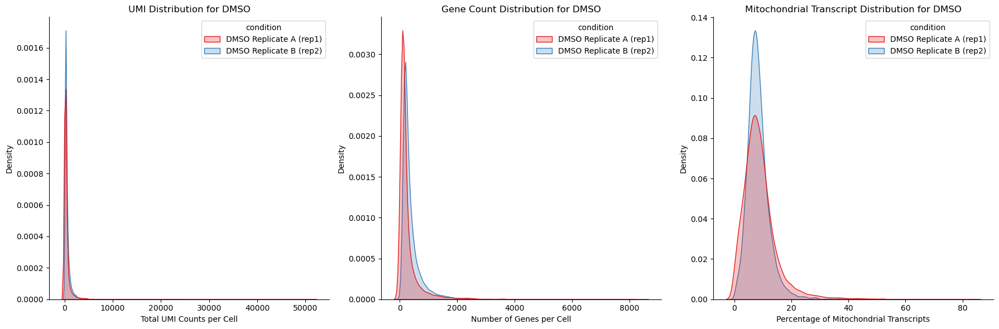

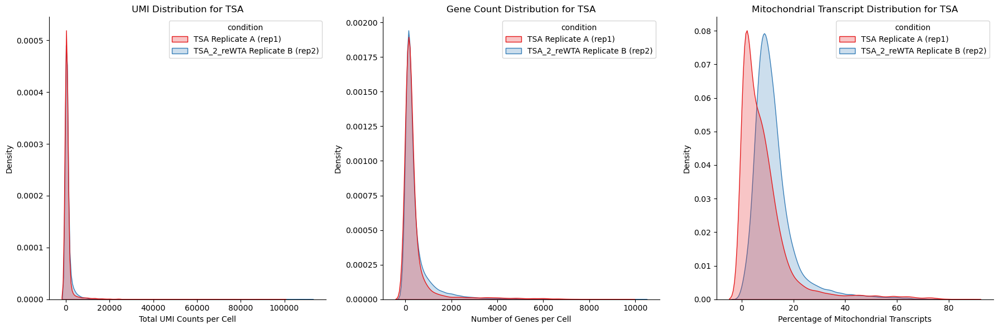

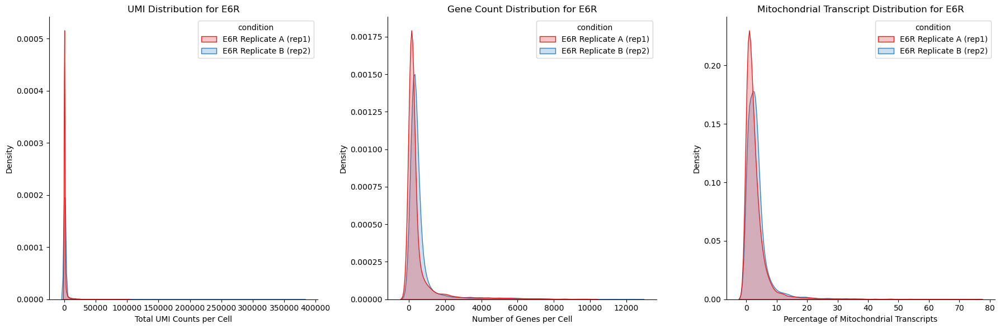

In [16]:
#Function to plot UMI, Genes & MT-transcripts side by side for each treatment
def plot_combined_distribution(data, condition):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))  #Create a 1x3 grid for subplots

    #Plot UMI counts per cell
    sns.kdeplot(data=data, x="total_counts", hue="condition", fill=True, palette="Set1", ax=axes[0], common_norm=False)
    axes[0].set_title(f'UMI Distribution for {condition}')
    axes[0].set_xlabel('Total UMI Counts per Cell')
    axes[0].set_ylabel('Density')
    sns.despine(ax=axes[0])

    #Plot number of genes expressed per cell
    sns.kdeplot(data=data, x="n_genes_by_counts", hue="condition", fill=True, palette="Set1", ax=axes[1], common_norm=False)
    axes[1].set_title(f'Gene Count Distribution for {condition}')
    axes[1].set_xlabel('Number of Genes per Cell')
    axes[1].set_ylabel('Density')
    sns.despine(ax=axes[1])

    #Plot %mitochondrial transcript 
    sns.kdeplot(data=data, x="pct_counts_mt", hue="condition", fill=True, palette="Set1", ax=axes[2], common_norm=False)
    axes[2].set_title(f'Mitochondrial Transcript Distribution for {condition}')
    axes[2].set_xlabel('Percentage of Mitochondrial Transcripts')
    axes[2].set_ylabel('Density')
    sns.despine(ax=axes[2])

    #Remove the grid
    for ax in axes:
        ax.grid(False)

    #Display the plots
    plt.tight_layout()
    plt.show()

#Modify to handle both TSA & TSA_2_reWTA
for condition in ["DMSO", "TSA", "E6R"]:
    if condition == "TSA":
        condition_data = adata_merged[adata_merged.obs['treatment'].isin(["TSA", "TSA_2_reWTA"])].obs
    else:
        condition_data = adata_merged[adata_merged.obs['treatment'] == condition].obs
    
    plot_combined_distribution(condition_data, condition)


#Why do the technical replicates of TSA have different distributions of MT-transcripts?! 
#For UMI & genes, it's quite consistent. MT% might be related to 

Notes on different distribution of %MT-transcripts for TSA technical replicates:

- differences in cell viability. Generally, it should be controlled during library prep. 
- batch-specific differences in RNA degradation or cell lysis. 
- Sequencing depth variation. But this is also controlled. 
- In platforms like Seq-Well, the efficiency with which beads capture mRNA can vary. This might lead to one sample having more "captured" mitochondrial RNA compared to the other due to bead performance.

In [17]:
#Function to calculate & display summary statistics per treatment
def calculate_summary_stats(adata, groupby_col, metrics):
    summary_stats = {}
    
    for condition in adata.obs[groupby_col].unique():
        condition_data = adata[adata.obs[groupby_col] == condition].obs
        condition_summary = {}
        
        for metric in metrics:
            condition_summary[metric] = {
                "Mean": condition_data[metric].mean(),
                "Median": condition_data[metric].median(),
                "Q1": condition_data[metric].quantile(0.25),
                "Q3": condition_data[metric].quantile(0.75),
                "Min": condition_data[metric].min(),
                "Max": condition_data[metric].max(),
            }
        
        summary_stats[condition] = pd.DataFrame(condition_summary)
    
    return summary_stats


#Define the metrics you want to calculate statistics for
metrics = ['total_counts', 'n_genes_by_counts', 'pct_counts_mt']

#Calculate summary statistics per condition (DMSO, TSA, E6R)
summary_stats = calculate_summary_stats(adata_merged, "treatment", metrics)

#Display results
for condition, stats in summary_stats.items():
    print(f"Summary statistics for {condition}:")
    display(stats)
    print("\n")

Summary statistics for DMSO:


,total_counts,n_genes_by_counts,pct_counts_mt
Mean,497.096649,344.162944,8.670185
Median,224.000000,194.000000,7.784431
Q1,138.000000,123.000000,5.542017
Q3,461.000000,371.000000,10.489511
Min,62.000000,25.000000,0.000000
Max,51673.000000,8477.000000,83.412323




Summary statistics for TSA:


,total_counts,n_genes_by_counts,pct_counts_mt
Mean,1168.560547,477.656437,8.891515
Median,201.000000,163.000000,6.060606
Q1,124.000000,106.000000,2.127660
Q3,467.000000,342.000000,11.057433
Min,89.000000,14.000000,0.000000
Max,98802.000000,9542.000000,87.628868




Summary statistics for TSA_2_reWTA:


,total_counts,n_genes_by_counts,pct_counts_mt
Mean,1149.145142,484.330735,12.610526
Median,271.000000,192.000000,10.516605
Q1,140.000000,109.000000,7.446808
Q3,765.000000,461.000000,14.725408
Min,91.000000,16.000000,0.000000
Max,111520.000000,10151.000000,75.981026




Summary statistics for E6R:


,total_counts,n_genes_by_counts,pct_counts_mt
Mean,1595.107422,601.637156,3.410923
Median,282.000000,249.000000,2.203588
Q1,167.000000,151.000000,0.909091
Q3,565.500000,464.000000,3.829787
Min,87.000000,18.000000,0.000000
Max,379416.000000,12436.000000,75.454544


High mitochondrial transcript activity is often seen in stressed or dying cells, particularly in cancer cell lines like neuroblastoma. Fine-tuning the cutoff can help balance retaining useful data while filtering out low-quality cells

In [18]:
#Iterate a few values & see how it affects the #cells retained: 
for mt_threshold in range(5, 45, 5):
    filtered_data = adata_merged[adata_merged.obs['pct_counts_mt'] < mt_threshold]
    print(f"MT cutoff: {mt_threshold}%, Cells remaining: {filtered_data.shape[0]}")

#Either 15 or 20% is a decent choice. But we can also stick to 40% to retain the majority %cells & do more QC downstream to check if any subset of cells 
#are ambiguous or biological doublets. 

MT cutoff: 5%, Cells remaining: 39446
MT cutoff: 10%, Cells remaining: 67535
MT cutoff: 15%, Cells remaining: 81261
MT cutoff: 20%, Cells remaining: 85685
MT cutoff: 25%, Cells remaining: 87388
MT cutoff: 30%, Cells remaining: 88269
MT cutoff: 35%, Cells remaining: 88816
MT cutoff: 40%, Cells remaining: 89189


Since neuroblastoma cells can exhibit a higher mitochondrial transcript percentage due to their stress levels & underlying biology, a higher cutoff might be reasonable compared to other cell types. However, it’s essential to balance retaining enough cells for meaningful downstream analysis while removing low-quality ones. Based on our distribution, thresholds between 15% to 25% seem to retain a significant portion of cells, without including too many potentially low-quality ones.

In [19]:
#Re-run the filtering with the updated grouping based on treatment02
for mt_threshold in range(10, 45, 5):
    print(f"MT cutoff: {mt_threshold}%")
    for condition in ["DMSO", "TSA", "E6R"]:
        condition_data = adata_merged[adata_merged.obs['treatment02'] == condition].obs
        filtered_data = condition_data[condition_data['pct_counts_mt'] < mt_threshold]
        print(f"   Treatment: {condition}, Cells remaining: {filtered_data.shape[0]}")

MT cutoff: 10%
   Treatment: DMSO, Cells remaining: 21429
   Treatment: TSA, Cells remaining: 17498
   Treatment: E6R, Cells remaining: 28608
MT cutoff: 15%
   Treatment: DMSO, Cells remaining: 27628
   Treatment: TSA, Cells remaining: 24319
   Treatment: E6R, Cells remaining: 29314
MT cutoff: 20%
   Treatment: DMSO, Cells remaining: 29085
   Treatment: TSA, Cells remaining: 26994
   Treatment: E6R, Cells remaining: 29606
MT cutoff: 25%
   Treatment: DMSO, Cells remaining: 29573
   Treatment: TSA, Cells remaining: 28049
   Treatment: E6R, Cells remaining: 29766
MT cutoff: 30%
   Treatment: DMSO, Cells remaining: 29793
   Treatment: TSA, Cells remaining: 28611
   Treatment: E6R, Cells remaining: 29865
MT cutoff: 35%
   Treatment: DMSO, Cells remaining: 29890
   Treatment: TSA, Cells remaining: 28984
   Treatment: E6R, Cells remaining: 29942
MT cutoff: 40%
   Treatment: DMSO, Cells remaining: 29959
   Treatment: TSA, Cells remaining: 29225
   Treatment: E6R, Cells remaining: 30005


Key notes:

Above we can see that TSA is most affected by the %MT-transcript cutoff. Here's why:

- At 10% MT cutoff, TSA already drops to 17,498 cells, while the other groups (DMSO: 21,429, E6R: 28,608) retain a higher #cells.
- As the cutoff increases, TSA consistently has fewer cells remaining compared to DMSO & E6R, with significant drops in the number of cells between 10% and 20% MT cutoff.

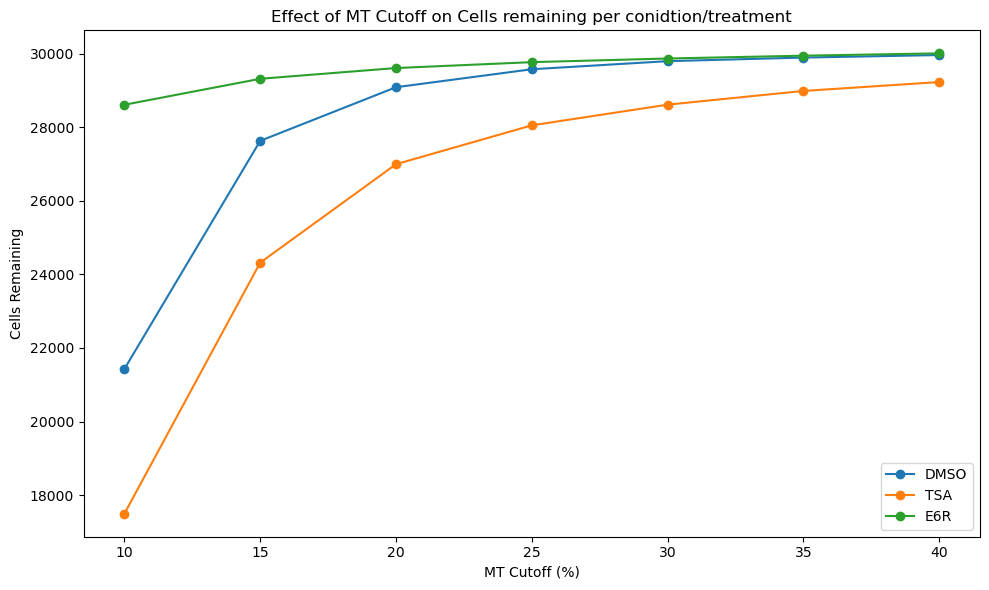

In [20]:
#Visualize the effects of filtering cells by %MT-transcripts: 

mt_thresholds = list(range(10, 45, 5))

cells_remaining_per_condition = {
    "DMSO": [21429, 27628, 29085, 29573, 29793, 29890, 29959],
    "TSA": [17498, 24319, 26994, 28049, 28611, 28984, 29225],
    "E6R": [28608, 29314, 29606, 29766, 29865, 29942, 30005]
}

#Create the plot to decide on a suitable cut-off: 
plt.figure(figsize=(10, 6))

for condition, cells_remaining in cells_remaining_per_condition.items():
    plt.plot(mt_thresholds, cells_remaining, marker='o', label=condition)

#Add labels and title
plt.xlabel('MT Cutoff (%)')
plt.ylabel('Cells Remaining')
plt.title('Effect of MT Cutoff on Cells remaining per conidtion/treatment')
plt.legend()

#Show the plot
plt.grid(False)
plt.tight_layout()
plt.show()

General observations:

I). DMSO (blue): The number of cells retained increases steeply between 10% & 20% MT cutoff, stabilizing at around 30%. A cutoff between 20% & 25% seems appropriate here, balancing cell retention and likely removing low-quality cells.

II). TSA (orange): TSA is most affected by lower MT cutoffs, with significant cell loss between 10% & 15%. Cell retention becomes more stable from 25% onward, so a cutoff around 25%–30% might be optimal to retain more cells while removing low-quality ones.

III). E6R (green): This group is the least affected by MT cutoffs, with a relatively stable number of cells after 20%. A cutoff of 25%–30% is reasonable here too, considering the consistent number of cells after that point.

In [21]:
#Even though we can relax the TSA cut-off to 25%, we stuck to 20% for consistency across samples. 
#For more ground work on QC & thresholds on #UMI & #genes, please see: scRNAseq_QC_Step1_160924.ipynb 

adata_merged.obs['treatment02'].value_counts()

treatment02
E6R     30159
DMSO    30084
TSA     30063
Name: count, dtype: int64

In [22]:
import numpy as np
from scipy.stats import median_abs_deviation

#First, we define a function that takes a metric, i.e. a column in .obs & the number of MADs (nmad) that is still permissive within the filtering strategy.
#We want to filter the "MAD" cells i.e., the outliers/chaotic ones according to the data ditribution. 
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier


adata_merged.obs["outlier_MAD"] = (
    is_outlier(adata_merged, "log1p_total_counts", 5)
    | is_outlier(adata_merged, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata_merged, "pct_counts_in_top_20_genes", 5)
)

adata_merged.obs.outlier_MAD.value_counts()

outlier_MAD
False    84665
True      5641
Name: count, dtype: int64

In [23]:
#Filter out the outliers identified using MAD approach. 
adata_final_filtered = adata_merged[~adata_merged.obs["outlier_MAD"]]

#Print the final number of cells remaining after filtering
print(f"Final number of cells remaining after MAD filtering: {adata_final_filtered.shape[0]}")

print(adata_final_filtered.obs['condition'].value_counts()) #After outlier filtering, the composition per sample looks consistent 

Final number of cells remaining after MAD filtering: 84665
condition
DMSO Replicate B (rep2)           14950
DMSO Replicate A (rep1)           14761
E6R Replicate A (rep1)            14323
E6R Replicate B (rep2)            14249
TSA Replicate A (rep1)            13328
TSA_2_reWTA Replicate B (rep2)    13054
Name: count, dtype: int64


In [24]:
#Albeit we could have used a 25% cut-off for TSA (this could have retained ~800 more cells in TSA), but we chose to stick to 20% 
#to avoid any technical effects of high %MT expression 
adata_final_filtered02 = adata_final_filtered[adata_final_filtered.obs.pct_counts_mt < 20, :].copy()
adata_final_filtered02.n_obs

#There is still chance that a small portion of the cells (between 15-20%) are metabolically stressed but we can adjust for MT genes 
#during data integration 

print(adata_final_filtered02.obs['condition'].value_counts()) #After %MT filtering, TSA replicates are relatively more affected. DMSO & E6R are consistent. 

condition
DMSO Replicate B (rep2)           14754
E6R Replicate A (rep1)            14228
DMSO Replicate A (rep1)           14163
E6R Replicate B (rep2)            14043
TSA Replicate A (rep1)            12866
TSA_2_reWTA Replicate B (rep2)    12256
Name: count, dtype: int64


In [25]:
adata_final_filtered02.n_obs

82310

To derive a strategy similar to the above approach with mitochondrial transcripts, we can apply a filtering approach iteratively for different thresholds on total_counts. Here's a possible workflow for systematically evaluating and setting cutoffs for total counts:

This is sort of important as UMI is linked to sequencing depth. So, a very low UMI is an indicative of poor sequencing quality.

In [26]:
#Iterate through different thresholds for total_counts
for total_count_threshold in range(100, 1000, 100):  #Adjust range and step size as needed
    filtered_data = adata_merged[adata_merged.obs['total_counts'] >= total_count_threshold]
    print(f"Total counts cutoff: {total_count_threshold}, Cells remaining: {filtered_data.shape[0]}")

#Notice the sharp drop when we use minimum total_counts=200. Does that indicate low-quality or rather low-complexity cells?! 
#Is it expected for Seq-well & the library prep? Need advice from Alex. 

Total counts cutoff: 100, Cells remaining: 80649
Total counts cutoff: 200, Cells remaining: 54524
Total counts cutoff: 300, Cells remaining: 38323
Total counts cutoff: 400, Cells remaining: 29654
Total counts cutoff: 500, Cells remaining: 24030
Total counts cutoff: 600, Cells remaining: 20246
Total counts cutoff: 700, Cells remaining: 17492
Total counts cutoff: 800, Cells remaining: 15495
Total counts cutoff: 900, Cells remaining: 13960


In [27]:
#Modify loop to capture the number of remaining cells for each condition per threshold: 
total_count_thresholds = range(100, 1000, 100)
cells_remaining_per_condition = {"DMSO": [], "TSA": [], "E6R": []}

for total_count_threshold in total_count_thresholds:
    print(f"Total counts cutoff: {total_count_threshold}")

    #Done on initial/non-filtered samples: adata_merged 
    for condition in ["DMSO", "TSA", "E6R"]:
        condition_data = adata_merged[adata_merged.obs['treatment02'] == condition]
        filtered_data = condition_data[condition_data.obs['total_counts'] >= total_count_threshold]
        cells_remaining_per_condition[condition].append(filtered_data.shape[0])
        print(f"   {condition}: {filtered_data.shape[0]} cells remaining")

Total counts cutoff: 100
   DMSO: 25062 cells remaining
   TSA: 27704 cells remaining
   E6R: 27883 cells remaining
Total counts cutoff: 200
   DMSO: 16671 cells remaining
   TSA: 16614 cells remaining
   E6R: 21239 cells remaining
Total counts cutoff: 300
   DMSO: 11564 cells remaining
   TSA: 12542 cells remaining
   E6R: 14217 cells remaining
Total counts cutoff: 400
   DMSO: 8740 cells remaining
   TSA: 10227 cells remaining
   E6R: 10687 cells remaining
Total counts cutoff: 500
   DMSO: 6885 cells remaining
   TSA: 8640 cells remaining
   E6R: 8505 cells remaining
Total counts cutoff: 600
   DMSO: 5572 cells remaining
   TSA: 7556 cells remaining
   E6R: 7118 cells remaining
Total counts cutoff: 700
   DMSO: 4620 cells remaining
   TSA: 6711 cells remaining
   E6R: 6161 cells remaining
Total counts cutoff: 800
   DMSO: 3959 cells remaining
   TSA: 6090 cells remaining
   E6R: 5446 cells remaining
Total counts cutoff: 900
   DMSO: 3425 cells remaining
   TSA: 5589 cells remaining
 

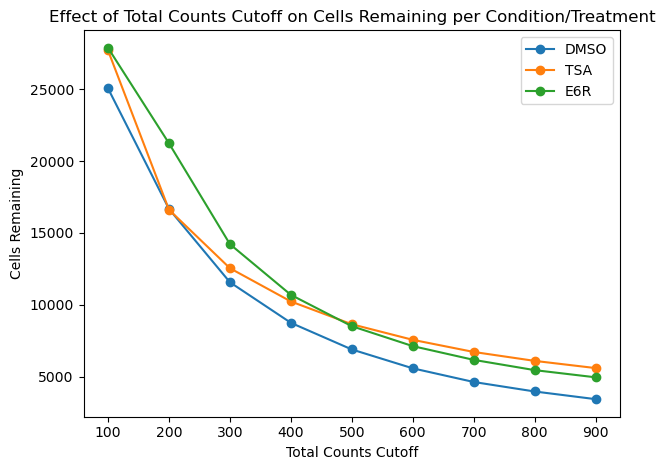

In [28]:
#Plot the remaining cells for each condition
for condition, cells_remaining in cells_remaining_per_condition.items():
    plt.plot(total_count_thresholds, cells_remaining, marker='o', label=condition)

#Add labels/title
plt.xlabel('Total Counts Cutoff')
plt.ylabel('Cells Remaining')
plt.title('Effect of Total Counts Cutoff on Cells Remaining per Condition/Treatment')
plt.legend()

#Show the plot
plt.grid(False)
plt.tight_layout()
plt.show()

From the UMI plot above, we see that:

- At lower thresholds (100–300 total counts), a large #cells are retained. However, going beyond a 300–500 range results in a steep decline, which could suggest filtering out valuable data.

- E6R & TSA are quite consistent across the threshold changes compared to DMSO, which shows a more pronounced drop. This might indicate that DMSO has lower-quality or more fragile cells that are being filtered out earlier.

- With UMI lower bound of 100, we can have 80649 cells downstream. However, using a 200 cut-off can reduce it to 54k which is a huge drop in our dataset.

- As an alternative, we can leverage "complexity" which looks into a ratio of UMI to #genes to find low-quality cells. Typically, complexity > 0.8 indicates good QC.

- A high complexity value indicates that a cell has many unique UMI counts relative to the number of genes detected, which typically corresponds to a healthier or more intact cell.

In [29]:
#Iterate through different thresholds for total_counts for "adata_final_filtered02" (already filtered for %MT)

for total_count_threshold in range(100, 1000, 100):  #Adjust range and step size as needed
    filtered_data = adata_final_filtered02[adata_final_filtered02.obs['total_counts'] >= total_count_threshold]
    print(f"Total counts cutoff: {total_count_threshold}, Cells remaining: {filtered_data.shape[0]}")

#Okay, after filtering for cells > 20% MT genes, we'll have 73199 cells applying a UMI cut-off of 100. 

Total counts cutoff: 100, Cells remaining: 73199
Total counts cutoff: 200, Cells remaining: 48780
Total counts cutoff: 300, Cells remaining: 33430
Total counts cutoff: 400, Cells remaining: 25258
Total counts cutoff: 500, Cells remaining: 19983
Total counts cutoff: 600, Cells remaining: 16439
Total counts cutoff: 700, Cells remaining: 13869
Total counts cutoff: 800, Cells remaining: 12023
Total counts cutoff: 900, Cells remaining: 10585


Total counts cutoff: 100
   DMSO: 24110 cells remaining
   TSA: 23079 cells remaining
   E6R: 26010 cells remaining
Total counts cutoff: 200
   DMSO: 15956 cells remaining
   TSA: 13370 cells remaining
   E6R: 19454 cells remaining
Total counts cutoff: 300
   DMSO: 10981 cells remaining
   TSA: 9895 cells remaining
   E6R: 12554 cells remaining
Total counts cutoff: 400
   DMSO: 8249 cells remaining
   TSA: 7900 cells remaining
   E6R: 9109 cells remaining
Total counts cutoff: 500
   DMSO: 6461 cells remaining
   TSA: 6550 cells remaining
   E6R: 6972 cells remaining
Total counts cutoff: 600
   DMSO: 5204 cells remaining
   TSA: 5622 cells remaining
   E6R: 5613 cells remaining
Total counts cutoff: 700
   DMSO: 4287 cells remaining
   TSA: 4888 cells remaining
   E6R: 4694 cells remaining
Total counts cutoff: 800
   DMSO: 3652 cells remaining
   TSA: 4368 cells remaining
   E6R: 4003 cells remaining
Total counts cutoff: 900
   DMSO: 3140 cells remaining
   TSA: 3933 cells remaining
   E

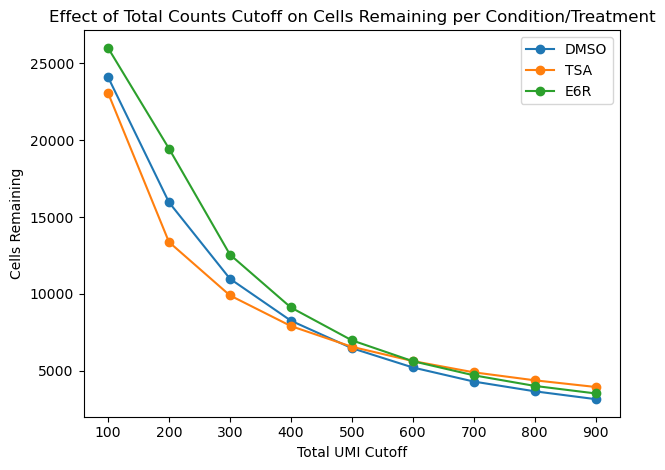

In [30]:
#Repeat the above graph for outliers+MT filtered object: adata_final_filtered02
total_count_thresholds = range(100, 1000, 100)

cells_remaining_per_condition = {"DMSO": [], "TSA": [], "E6R": []}

for total_count_threshold in total_count_thresholds:
    print(f"Total counts cutoff: {total_count_threshold}")
    
    for condition in ["DMSO", "TSA", "E6R"]:
        condition_data = adata_final_filtered02[adata_final_filtered02.obs['treatment02'] == condition]
        filtered_data = condition_data[condition_data.obs['total_counts'] >= total_count_threshold]
        cells_remaining_per_condition[condition].append(filtered_data.shape[0])
        print(f"   {condition}: {filtered_data.shape[0]} cells remaining")

#Plot the remaining cells for each condition
for condition, cells_remaining in cells_remaining_per_condition.items():
    plt.plot(total_count_thresholds, cells_remaining, marker='o', label=condition)

#Add labels/title
plt.xlabel('Total UMI Cutoff')
plt.ylabel('Cells Remaining')
plt.title('Effect of Total Counts Cutoff on Cells Remaining per Condition/Treatment')
plt.legend()

#Show the plot
plt.grid(False)
plt.tight_layout()
plt.show()

Given this pattern, it's a smart approach to balance between a reasonable UMI cutoff that retains as many high-quality cells as possible without being too strict & eliminating healthy cells with lower UMI counts. If NEBC is very heterogeneous, 200 itself would be a strict cut-off. So, let's evaluate "complexity" before making a decision here.

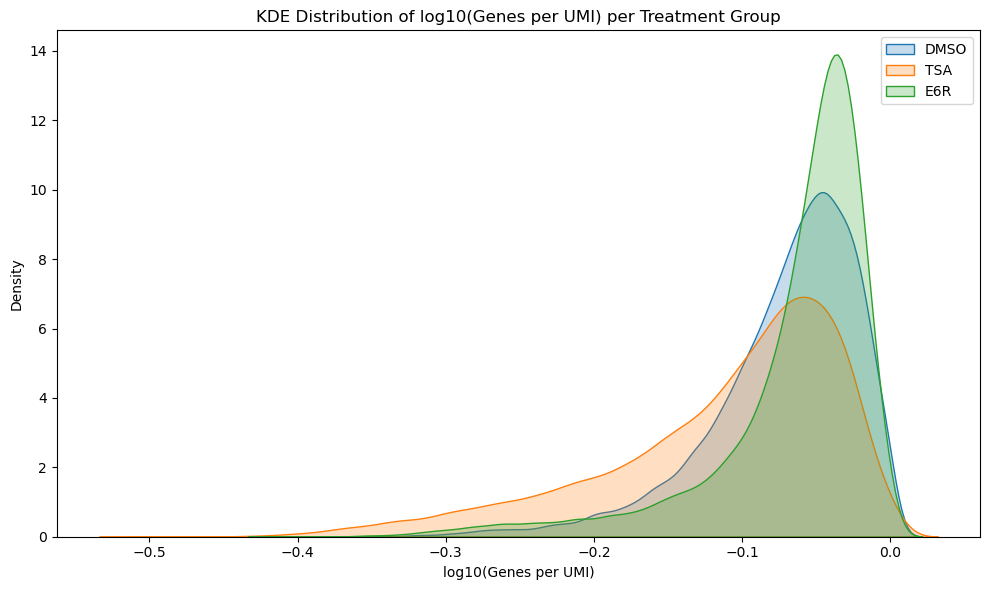

In [31]:
#Calculate "complexity" as a ratio of genes per UMI for each cell
adata_final_filtered02.obs['genes_per_umi'] = adata_final_filtered02.obs['n_genes_by_counts'] / adata_final_filtered02.obs['total_counts']

#Add the log10 value for Genes per UMI
adata_final_filtered02.obs['log10_genes_per_umi'] = np.log10(adata_final_filtered02.obs['genes_per_umi'])

#Plot KDE for log10(Genes per UMI)
plt.figure(figsize=(10, 6))
for treatment in adata_final_filtered02.obs['treatment02'].unique():
    sns.kdeplot(adata_final_filtered02.obs[adata_final_filtered02.obs['treatment02'] == treatment]['log10_genes_per_umi'], 
                label=treatment, fill=True, common_norm=False)


plt.xlabel('log10(Genes per UMI)')
plt.ylabel('Density')
plt.title('KDE Distribution of log10(Genes per UMI) per Treatment Group')
plt.legend()
plt.tight_layout()
plt.show()

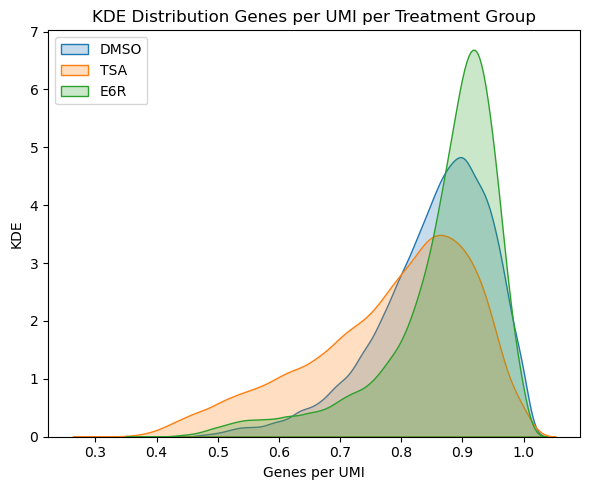

In [32]:
#Plot unlogged genes/UMI ratios: 

plt.figure(figsize=(6, 5))
for treatment in adata_final_filtered02.obs['treatment02'].unique():
    sns.kdeplot(adata_final_filtered02.obs[adata_final_filtered02.obs['treatment02'] == treatment]['genes_per_umi'], 
                label=treatment, fill=True, common_norm=False)

#Add labels/title
plt.xlabel('Genes per UMI')
plt.ylabel('KDE')
plt.title('KDE Distribution Genes per UMI per Treatment Group')
plt.legend()
plt.tight_layout()
plt.show()

#By filtering for complexity, we consider both effects of UMI & genes together and it might help prevent losing a major %cells in QC. 

In [33]:
#Loop through complexity (genes/UMI) cutoffs from 0.3 to 0.6
for complexity_cutoff in np.arange(0.3, 0.7, 0.1):
    filtered_data = adata_final_filtered02[adata_final_filtered02.obs['genes_per_umi'] >= complexity_cutoff]
    print(f"Complexity cutoff: {complexity_cutoff:.1f}, Cells remaining: {filtered_data.shape[0]}")

print(adata_final_filtered02.obs['genes_per_umi'].describe()) 

#Interestingly, mean complexity is 0.836498 (pretty good!) 
#Maybe, our dataset isn't that confounded by low UMI cells as we initially thought?! 

Complexity cutoff: 0.3, Cells remaining: 82310
Complexity cutoff: 0.4, Cells remaining: 82246
Complexity cutoff: 0.5, Cells remaining: 81192
Complexity cutoff: 0.6, Cells remaining: 77935
count    82310.000000
mean         0.836498
std          0.114326
min          0.314883
25%          0.782334
50%          0.865672
75%          0.919192
max          1.000000
Name: genes_per_umi, dtype: float64


A cut-off of 0.5 for the complexity ratio is reasonable since it helps retain cells with a good number of genes per UMI, striking a balance between excluding low-quality cells while retaining sufficient data.

A cut-off of 0.5 for the complexity ratio is reasonable since it helps retain cells with a good number of genes per UMI, striking a balance between excluding low-quality cells & retaining sufficient data. However, we can model "complexity" as a continuous covariate in the scVI model.

In [34]:
#Apply the filtering based on complexity (genes per UMI >= 0.5)
adata_final_filtered03 = adata_final_filtered02[adata_final_filtered02.obs['genes_per_umi'] >= 0.5, :].copy()

#Check the number of remaining cells
print(f"Number of cells remaining after complexity filtering after MADS & MT: {adata_final_filtered03.n_obs}")

Number of cells remaining after complexity filtering after MADS & MT: 81192


In [35]:
#Include genes expressed in a minimum of 5 cells (default is 3 in Seurat/Scanpy):
sc.pp.filter_genes(adata_final_filtered03, min_cells=5)
adata_final_filtered03

AnnData object with n_obs × n_vars = 81192 × 25865
    obs: 'treatment', 'replicate', 'sample_id', 'total_counts', 'n_genes_by_counts', 'percent_mt', 'treatment02', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'condition', 'outlier_MAD', 'genes_per_umi', 'log10_genes_per_umi'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'

I). QC until now (summing up for Julien/Alex/Josh & others):

- Filtering we've applied, combines MAD-based outlier detection, mitochondrial transcript thresholds, and complexity-based filtering (genes per UMI ratio), which seems quite robust:

- MAD-based filtering removed low-quality cells based on gene counts & UMI distribution, which helps ensure that extreme outliers don't skew the results.

- MT percentage cut-off is critical in scRNA-seq for removing cells with high mitochondrial content, as this often indicates stressed or dying cells. Setting a uniform cut-off across conditions simplifies the method and makes it easier to report (also for reviewers).

- Complexity filtering (genes per UMI ratio) helps ensure that the retained cells have a good balance between sequencing depth (UMIs) & the number of genes detected, focusing on cells with higher transcriptional diversity. It'd still use #genes, #UMI & complexity score as covariates in scVI model.

- Might not be necessary to filter by #UMI & we're struggling a bit with annotation.

In [36]:
#Further checks:
adata_qc01= adata_final_filtered03.copy()
adata_qc02= adata_final_filtered03.copy()

#Do the basic filtering too: Use min_genes cut-off as 100 
sc.pp.filter_cells(adata_qc01, min_genes=100)
print(adata_qc01.n_obs)

#Use min_genes cut-off as 200
#Even though 200 is a default choice, do we really need this for our analysis? 
sc.pp.filter_cells(adata_qc02, min_genes=200)
print(adata_qc02.n_obs) 

#P.S: Repeated analysis using both 100 & 200 cut-off. Apparently, 200 is a bit more clean. 

68452
41938


In [37]:
del adata_qc01
del adata_qc02

In [38]:
#Repeat Case-I: Only include cells expressing a minimum of 100 genes. 
adata_qc01= adata_final_filtered03.copy()
sc.pp.filter_cells(adata_qc01, min_genes=100)
print(adata_qc01.n_obs)

conditions = ["DMSO", "TSA", "E6R"]

#Store the initial number of cells per condition before filtering
initial_cells_per_condition = {}

#Loop through each condition to calculate the initial number of cells
for condition in conditions:
    condition_data = adata_final_filtered03[adata_final_filtered03.obs['treatment02'] == condition]
    initial_cells_per_condition[condition] = condition_data.n_obs

#Now, let's calculate the differences after the final filtering (using adata_qc01 for min_genes=100 filtered data)
filtered_cells_per_condition = {}

#Loop through each condition to calculate the number of cells after filtering
for condition in conditions:
    condition_data = adata_qc01[adata_qc01.obs['treatment02'] == condition]
    filtered_cells_per_condition[condition] = condition_data.n_obs

#Calculate the difference & percentage drop for each condition
for condition in conditions:
    initial_cells = initial_cells_per_condition[condition]
    filtered_cells = filtered_cells_per_condition[condition]
    difference = initial_cells - filtered_cells
    percentage_drop = (difference / initial_cells) * 100
    
    print(f"{condition}: Initial cells = {initial_cells}, Filtered cells = {filtered_cells}, "
          f"Difference = {difference}, Percentage drop = {percentage_drop:.2f}%")

68452
DMSO: Initial cells = 28871, Filtered cells = 23468, Difference = 5403, Percentage drop = 18.71%
TSA: Initial cells = 24210, Filtered cells = 19926, Difference = 4284, Percentage drop = 17.70%
E6R: Initial cells = 28111, Filtered cells = 25058, Difference = 3053, Percentage drop = 10.86%


II). Further insights from QC:

- DMSO & TSA show more substantial filtering, with ~18.71% and ~17.70% of cells removed, respectively.

- E6R has the least filtering effect, with only ~10.86% of cells removed.

- This might indicate that the DMSO & TSA samples contain a larger proportion of lower-quality cells or rather, low-complexity cells (after filtering for complexity, MT%, UMI, and gene counts).

- E6R might have relatively higher quality cells or fewer cells with high mitochondrial content or other QC issues.

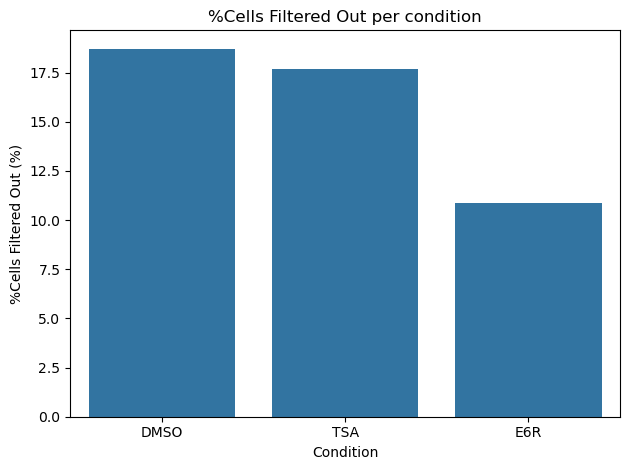

In [39]:
#Visualize the effect of #cells shrinkage after min_genes=100 cut-off:

data = {
    'Condition': ['DMSO', 'TSA', 'E6R'],
    'Initial Cells': [28871, 24210, 28111],
    'Filtered Cells': [23468, 19926, 25058],
    'Percentage Drop': [18.71, 17.70, 10.86]
}


df = pd.DataFrame(data)

#Create a boxplot to visualize the percentage drop across conditions
sns.barplot(x='Condition', y='Percentage Drop', data=df)

#Add labels and title
plt.xlabel('Condition')
plt.ylabel('%Cells Filtered Out (%)')
plt.title('%Cells Filtered Out per condition')
plt.tight_layout()

#Show the plot
plt.show()

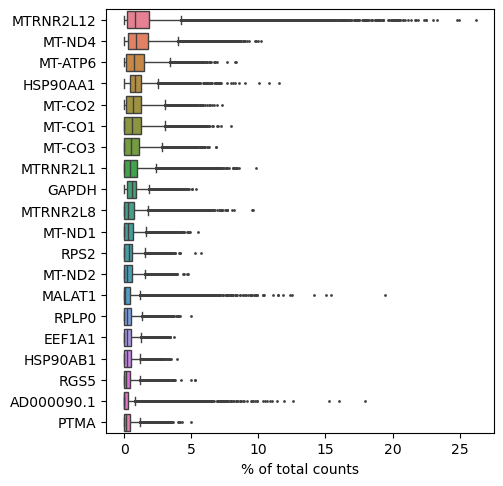

In [40]:
#Show those genes that yield the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata_qc01, n_top=20)

#We can remove GAPDH & MALAT1 
#Despite removing cells > 20% MT-transcripts, our top genes that dominated by MT. 

/home/olive0927/miniconda3/envs/scRNAseq_core_analysis/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 25865 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


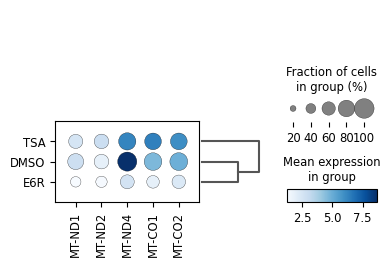

In [41]:
#Let's see if the MT-genes are relatively more robust in one category:

sc.pl.dotplot(adata_qc01, ['MT-ND1', 'MT-ND2', 'MT-ND4', 'MT-CO1', 'MT-CO2'], 
    groupby="treatment02",
    dendrogram=True,
    color_map="Blues",
    swap_axes=False) 

#E6R has much lesser expression of MT-genes as compared to DMSO & TSA (seems more of a biological effect). 

In [42]:
del adata_qc01

In [43]:
#Now, investigate the upper bound of UMI as very high UMI is indicative of doublets/multiplets. 

adata_new= adata_final_filtered03.copy()

#Iterate through different upper UMI bounds and check how many cells are filtered
for umi_upper_bound in range(5000, 20001, 5000):
    filtered_data = adata_new[adata_new.obs['total_counts'] <= umi_upper_bound]
    print(f"UMI upper bound: {umi_upper_bound}, Cells remaining: {filtered_data.shape[0]}")

UMI upper bound: 5000, Cells remaining: 81081
UMI upper bound: 10000, Cells remaining: 81192
UMI upper bound: 15000, Cells remaining: 81192
UMI upper bound: 20000, Cells remaining: 81192


Number of cells remaining after applying UMI upper bound of 5000: 81081


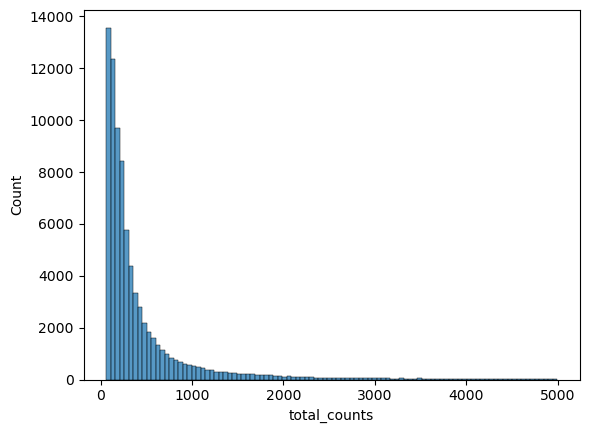

In [44]:
#Apply the UMI upper bound filter (5000) to adata_new
umi_upper_bound = 5000
adata_new = adata_new[adata_new.obs['total_counts'] <= umi_upper_bound, :].copy()

#Check the number of cells remaining after filtering
print(f"Number of cells remaining after applying UMI upper bound of {umi_upper_bound}: {adata_new.n_obs}")

p1 = sns.histplot(adata_new.obs["total_counts"], bins=100, kde=False)

In [45]:
adata_new.raw= adata_new #Keep the raw data safe before normalization & other steps 
adata_new.raw.X

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 26697452 stored elements and shape (81081, 25865)>

In [46]:
adata_new.layers['counts']= adata_new.raw.X #we'll need it for scVI integration 
adata_new.layers['counts']

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 26697452 stored elements and shape (81081, 25865)>

In [47]:
#Correct library size to 10,000 reads per cell to make things comparable: 
#sc.pp.normalize_total(adata_new, target_sum=1e4)

#Logarithmize the data:
#sc.pp.log1p(adata_new)

#Alternatively, we can do Shifted normalization or Analytic Pearson residuals to see if they better adjust the technical confounders. 
#Update: Ran Shifted norm & it gave pretty consistent PCA/clustering as log-norm. 

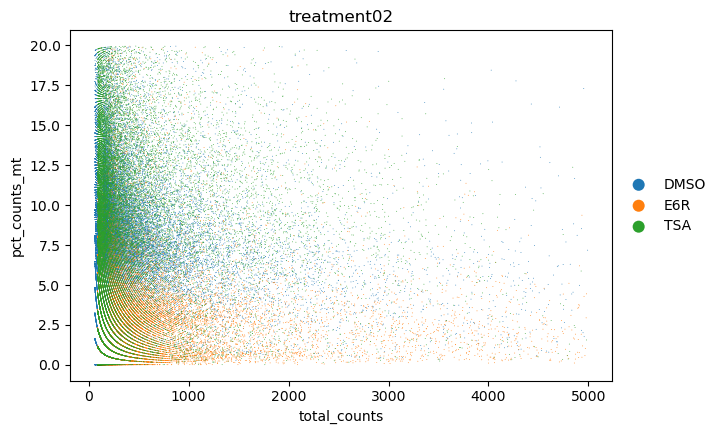

In [48]:
sc.pl.scatter(adata_new, x='total_counts', y='pct_counts_mt', color='treatment02')

In [49]:
#Modify loop to capture the number of remaining cells for each condition per threshold: 
total_count_thresholds = range(100, 1000, 100)
cells_remaining_per_condition = {"DMSO": [], "TSA": [], "E6R": []}

for total_count_threshold in total_count_thresholds:
    print(f"Total counts cutoff: {total_count_threshold}")
    
    for condition in ["DMSO", "TSA", "E6R"]:
        condition_data = adata_new[adata_new.obs['treatment02'] == condition]
        filtered_data = condition_data[condition_data.obs['total_counts'] >= total_count_threshold]
        cells_remaining_per_condition[condition].append(filtered_data.shape[0])
        print(f"   {condition}: {filtered_data.shape[0]} cells remaining")

Total counts cutoff: 100
   DMSO: 24030 cells remaining
   TSA: 22150 cells remaining
   E6R: 25790 cells remaining
Total counts cutoff: 200
   DMSO: 15876 cells remaining
   TSA: 12441 cells remaining
   E6R: 19234 cells remaining
Total counts cutoff: 300
   DMSO: 10901 cells remaining
   TSA: 8966 cells remaining
   E6R: 12334 cells remaining
Total counts cutoff: 400
   DMSO: 8169 cells remaining
   TSA: 6971 cells remaining
   E6R: 8889 cells remaining
Total counts cutoff: 500
   DMSO: 6381 cells remaining
   TSA: 5621 cells remaining
   E6R: 6752 cells remaining
Total counts cutoff: 600
   DMSO: 5124 cells remaining
   TSA: 4695 cells remaining
   E6R: 5393 cells remaining
Total counts cutoff: 700
   DMSO: 4207 cells remaining
   TSA: 3964 cells remaining
   E6R: 4474 cells remaining
Total counts cutoff: 800
   DMSO: 3572 cells remaining
   TSA: 3453 cells remaining
   E6R: 3783 cells remaining
Total counts cutoff: 900
   DMSO: 3060 cells remaining
   TSA: 3025 cells remaining
   E

In [50]:
#Applying the UMI lower-bound filter to prevent abrupt loss of data
#For Seq-Well, 100 seems to work better as compared to 300-500 range typically associated with 10X V2 (& 500-1000 associated with 10X V3) 
umi_lower_bound = 100
adata_new = adata_new[adata_new.obs['total_counts'] >= umi_lower_bound, :].copy()

#Check the number of cells remaining after filtering
print(f"Number of cells remaining after applying UMI lower bound: {adata_new.n_obs}")

#Print composition per treatment:
adata_new.obs['sample_id'].value_counts()

Number of cells remaining after applying UMI lower bound: 71970


sample_id
GSM6481233    14716
GSM6481237    13927
GSM6481236    11863
GSM6481234    11401
GSM6481235    10749
GSM6481232     9314
Name: count, dtype: int64

In [51]:
adata_new

AnnData object with n_obs × n_vars = 71970 × 25865
    obs: 'treatment', 'replicate', 'sample_id', 'total_counts', 'n_genes_by_counts', 'percent_mt', 'treatment02', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'condition', 'outlier_MAD', 'genes_per_umi', 'log10_genes_per_umi'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'treatment02_colors'
    layers: 'counts'

In [52]:
#After discussion & referring to line-41, to prevent confounding factors like MT/ribosomes, etc, we fell back to 200: 
##If we used sc.pp.filter_cells(adata_new, min_genes=100), scrublet gave 18,523 systemic doublets (documented internally) 
#Albeit we don't fully understand if those 18k cells are true biological doublets, given the lack of a proper reference atlas of NEBC
#& the lack of understanding of underlying cell types/states 

sc.pp.filter_cells(adata_new, min_genes=200)
adata_new.n_obs #refer to NEBC_integration_v1_190924.ipynb for consistency 

41827

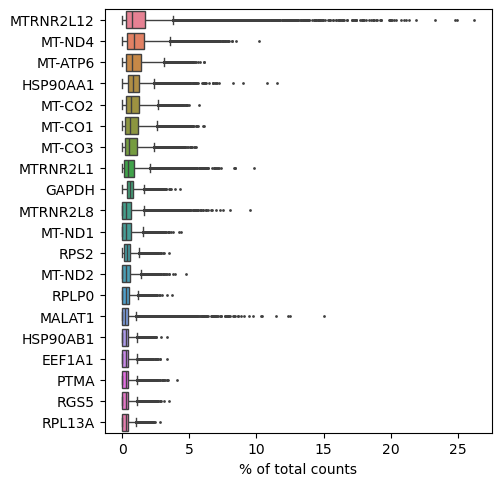

In [53]:
#Show those genes that yield the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata_new, n_top=20)

/tmp/ipykernel_21117/2879228649.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr_per_treatment = adata_new.to_df().groupby(adata_new.obs['treatment02']).mean()


treatment02      DMSO       E6R       TSA
treatment02                              
DMSO         1.000000  0.878834  0.897855
E6R          0.878834  1.000000  0.794467
TSA          0.897855  0.794467  1.000000


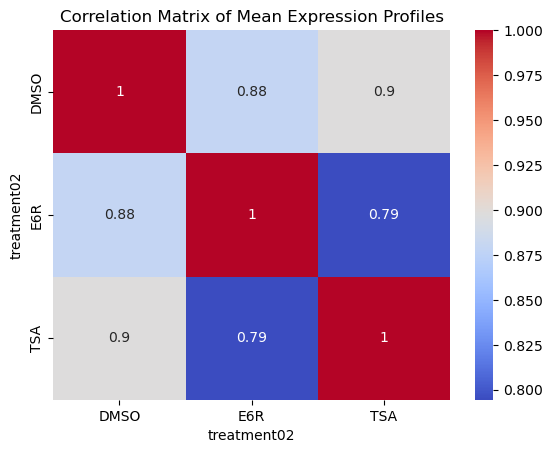

In [54]:
#Calculate the mean expression for each treatment
#Do this correlation map before & after filtering for HVG
mean_expr_per_treatment = adata_new.to_df().groupby(adata_new.obs['treatment02']).mean()

#Calculate Pearson correlation between treatments
corr_matrix = mean_expr_per_treatment.T.corr()
print(corr_matrix)

sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix of Mean Expression Profiles")
plt.show()

In [55]:
import scrublet as scr

#Add a column in obs to store doublet scores for each sample
adata_new.obs['doublet_score'] = np.nan
adata_new.obs['predicted_doublet'] = False

#Iterate over each sample
for sample in adata_new.obs['sample_id'].unique():
    
    #Subset the data for the specific sample
    adata_sample = adata_new[adata_new.obs['sample_id'] == sample]
    
    #Prepare the counts matrix for scrublet (convert to dense matrix if needed)
    scrub = scr.Scrublet(adata_sample.raw.X.toarray() if hasattr(adata_sample.raw.X, 'toarray') else adata_sample.X)
    
    #Run Scrublet
    doublet_scores, predicted_doublets = scrub.scrub_doublets()
    
    #Store the doublet scores and predicted doublets back to the original adata_new object
    adata_new.obs.loc[adata_sample.obs.index, 'doublet_score'] = doublet_scores
    adata_new.obs.loc[adata_sample.obs.index, 'predicted_doublet'] = predicted_doublets

    #Print status
    print(f'Processed Scrublet for sample: {sample}')

#Once done, you can inspect the adata_new for doublet scores
print(adata_new.obs[['sample_id', 'doublet_score', 'predicted_doublet']].head())

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.33
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 0.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 37.5%
Elapsed time: 1.6 seconds
Processed Scrublet for sample: GSM6481232
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.38
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 5.0 seconds
Processed Scrublet for sample: GSM6481233
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.44
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.

In [56]:
adata_new.obs['predicted_doublet'].value_counts() #latest run 

#If we used sc.pp.filter_cells(adata_new, min_genes=100), scrublet gave 18,523 systemic doublets (which we couldn't group into true bio doublets)

predicted_doublet
False    40630
True      1197
Name: count, dtype: int64

In [57]:
#Are the flagged doublets enriched in a particular treatment category:
pd.crosstab(adata_new.obs['predicted_doublet'], adata_new.obs['treatment02'])

#We see that TSA is relatively more affected by doublets! (interesting!)

treatment02,DMSO,E6R,TSA
predicted_doublet,,,
False,13978,17398,9254
True,3,2,1192


In [58]:
#Specify the genes to remove: MALAT1, GAPDH or any other housekeeping genes can be included
#MALAT1 tend to confound marker analysis & is a non-specific lncRNA. 
genes_to_remove = ['MALAT1', 'GAPDH']

#Filter out MALAT1 and GAPDH from adata_new
adata_new = adata_new[:, ~adata_new.var_names.isin(genes_to_remove)].copy()
adata_new.n_vars

25863

In [59]:
adata_hvg= adata_new.copy() #create a copy for HVG sub-set 

#Correct library size to 10,000 reads per cell to make things comparable: 
sc.pp.normalize_total(adata_hvg, target_sum=1e4)

#Sum the total counts for each cell after normalization
total_counts_per_cell = adata_hvg.X.sum(axis=1)

#Logarithmize the data:
sc.pp.log1p(adata_hvg)

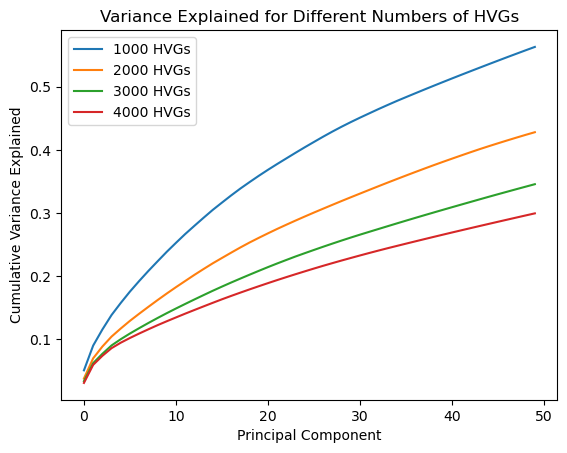

In [60]:
#Derived from scRNAseq_exploratory_analysis_Step2_170924.ipynb (we already saw 2000 HVGs should be selected) 
def plot_variance_explained(adata, n_hvg_values):
    for n_genes in n_hvg_values:
        
        #Find highly variable genes
        sc.pp.highly_variable_genes(adata, n_top_genes=n_genes, min_mean=0.0125, max_mean=3, min_disp=0.5)
        #PCA on HVG
        sc.tl.pca(adata, svd_solver='arpack')
        # Plot cumulative variance explained
        plt.plot(np.cumsum(adata.uns['pca']['variance_ratio']), label=f'{n_genes} HVGs')

    plt.xlabel('Principal Component')
    plt.ylabel('Cumulative Variance Explained')
    plt.legend()
    plt.title('Variance Explained for Different Numbers of HVGs')
    plt.show()

#Call the function with a list of n_top_genes to try
plot_variance_explained(adata_hvg, [1000, 2000, 3000, 4000])

From the plot, the variance explained improves with the number of HVF, but the increase becomes less pronounced after ~2,000 HVGs. Using 1,000 HVGs gives a relatively high variance explained & going up to 2,000 HVGs improves it further without a significant cost in terms of diminishing returns.

Based on this plot, 2,000 HVGs would be a good balance, providing significant variance explained while maintaining manageable #features for downstream analysis.

However, if we are unsure about the underlying cell type/state composition of NEBC, optimizing the #HVF & #PCs are tough.

In [61]:
#Identify the top 2000 highly variable genes (HVGs)
sc.pp.highly_variable_genes(adata_hvg, n_top_genes=2000, subset=True)
adata_hvg.n_vars

2000

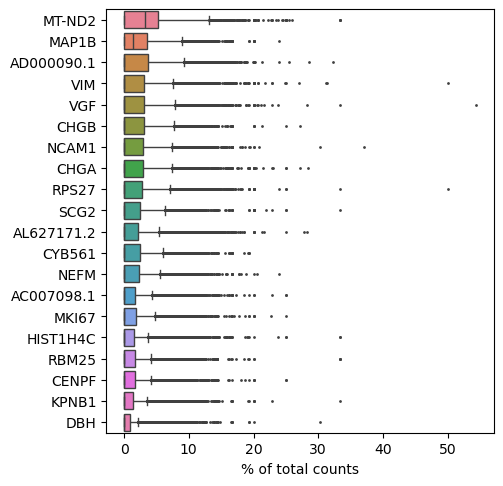

In [62]:
#Show those HVFs that yield the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata_hvg, n_top=20)

#Now, we have  nicely adjusted for MT/RB effects (see below) 
#CHGA & CHGB are neuroendocrine markers & CHGA is used as a diagnostic marker for NECs (lungs, prostate & GEP). 

treatment02      DMSO       E6R       TSA
treatment02                              
DMSO         1.000000  0.951341  0.760576
E6R          0.951341  1.000000  0.759182
TSA          0.760576  0.759182  1.000000


/tmp/ipykernel_21117/739423435.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr_per_treatment = adata_hvg.to_df().groupby(adata_hvg.obs['treatment02']).mean()


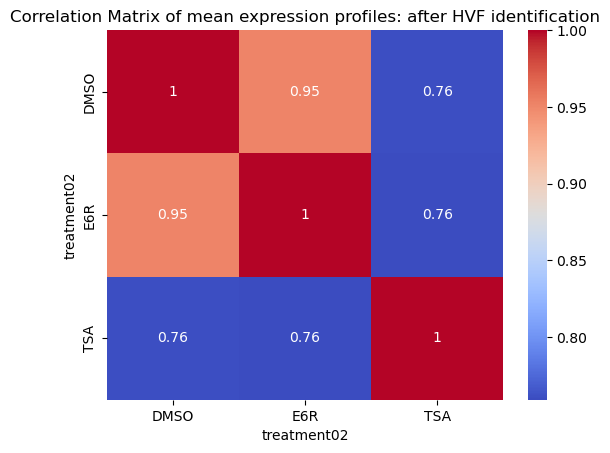

In [63]:
#Calculate the mean expression for each treatment
mean_expr_per_treatment = adata_hvg.to_df().groupby(adata_hvg.obs['treatment02']).mean()

#Calculate Pearson correlation between treatments
corr_matrix = mean_expr_per_treatment.T.corr()
print(corr_matrix)

sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix of mean expression profiles: after HVF identification")
plt.show()

#Here, E6R seems more similar to DMSO as compared to TSA. 

2025-06-09 16:24:07.142530: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-09 16:24:07.287588: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-06-09 16:24:07.340294: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-06-09 16:24:07.355822: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-09 16:24:07.448902: I tensorflow/core/platform/cpu_feature_guar

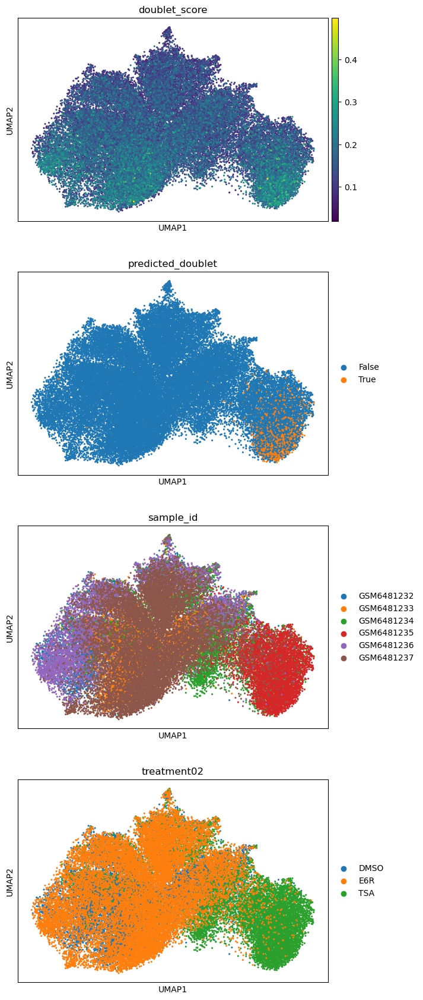

In [64]:
#Before model training & batch correction, check ~ground truth using PCA method:
sc.tl.pca(adata_hvg)
sc.pp.neighbors(adata_hvg, n_pcs=25) #15 is fine from the Elbow plot
sc.tl.umap(adata_hvg, maxiter=500)

#Visualize doublet scores on UMAP
sc.pl.umap(adata_hvg, color=['doublet_score', 'predicted_doublet', 'sample_id', 'treatment02'], size=20, ncols=1)

In [65]:
#Filter out 1197 predicted doublets for straightforward analysis:

adata_filtered= adata_hvg[adata_hvg.obs['predicted_doublet']== False]
adata_filtered.obs['predicted_doublet'].value_counts()

predicted_doublet
False    40630
Name: count, dtype: int64

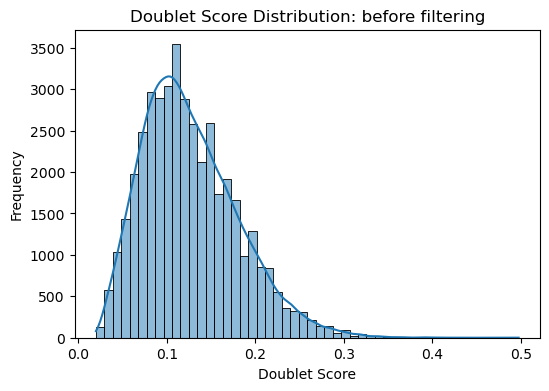

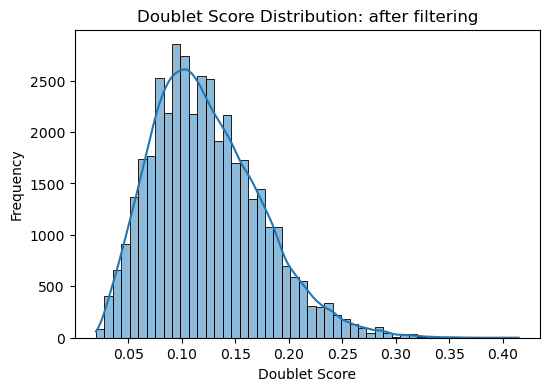

In [66]:
#Plot the distribution of doublet scores
plt.figure(figsize=(6, 4))
sns.histplot(adata_new.obs['doublet_score'], bins=50, kde=True)
plt.title('Doublet Score Distribution: before filtering')
plt.xlabel('Doublet Score')
plt.ylabel('Frequency')
plt.show()

#Plot the distribution of doublet scores
plt.figure(figsize=(6, 4))
sns.histplot(adata_filtered.obs['doublet_score'], bins=50, kde=True)
plt.title('Doublet Score Distribution: after filtering')
plt.xlabel('Doublet Score')
plt.ylabel('Frequency')
plt.show()

#In any case, our dataset isn't affected by doublets => we don't see any bimodal distribution separating the peak of normal vs doublets.
#However, if we retain these 1197 doublets, it causes less separation b/w TSA & E6R groups. 

In [67]:
from scvi.model import SCVI
import torch

In [69]:
#Check if CUDA is available
if torch.cuda.is_available():
    device = "cuda"
    print("Using CUDA for training.")
else:
    device = "cpu"
    print("CUDA not available. Using CPU.") 

Using CUDA for training.


In [70]:
#Setting a fixed seed for reproducibility
#note that weights in scVI from NN can change slightly anyway (because of inherent stochasticity underlying deep NN) 
seed = 42

#Set seed for Python's built-in random module
import random
random.seed(seed)

#Set seed for NumPy
np.random.seed(seed)

#Set seed for PyTorch
torch.manual_seed(seed)

In [71]:
#However for simplicty, we can move forward with filtered anndata now:

adata_filtered= adata_filtered.copy()

#Run scVI without any batch correction:
#Keep the continuous covariates. 
#Removed "doublet score" from covariate field because TSA has a relatively high D.S & it'd artificially mix TSA with other groups. 
SCVI.setup_anndata(adata_filtered, layer= "counts", batch_key= None, 
                       categorical_covariate_keys= None,
                       continuous_covariate_keys=["n_genes_by_counts", "total_counts", "pct_counts_mt", "genes_per_umi",
                                                 "pct_counts_ribo", "pct_counts_hb"])

In [72]:
vae_lv15_nobatch= SCVI(adata_filtered, n_layers=2, n_latent=15, gene_likelihood='zinb')
vae_lv15_nobatch #without key batch or SampleID

#Fine tuning LVs to 20 & 25 didn't change downstream clusters & integration. 

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 15, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

If we find that elbo_validation, validation_loss, and reconstruction_loss_validation are converging at the end of training, then our model is probably fine. Otherwise, we need to tweak the learning rate or number of epochs depending on what’s going on

In [73]:
#By default, the training runs 196.89 epochs (calculated as 20.000/n_cells*400 as defined in the function).
#max_epochs= 200 (rounded off)
#check_val_every_n_epoch=1 into train() to compute validation losses as well

vae_lv15_nobatch.train(max_epochs=200, 
    check_val_every_n_epoch=1, 
    early_stopping=True, 
    enable_model_summary=True, 
    early_stopping_patience=30,  #Adjust patience based on expected convergence
    enable_checkpointing=False,  #Set True if long training runs are expected
    progress_bar_refresh_rate=1)

#To check: NEBC_integration_v1_190924.ipynb

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX 2000 Ada Generation Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                | Params
--------------------------------------------------------
0 | module          | VAE                 | 1.3 M 
1 | elbo_train      | CompositionalMetric | 0     
2 | rec_loss_train  | ElboMetric          | 0     
3 | kl_local_train  | ElboMetric          | 0     
4 | kl_global_train | ElboMetric          | 0     
5 | elbo_val        | CompositionalMetric | 0     
6 | rec_l

Epoch 200/200: 100%|█████████████████████████████████████████████████████████████████████████| 200/200 [08:48<00:00,  2.43s/it, v_num=1, train_loss_step=100, train_loss_epoch=106]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|█████████████████████████████████████████████████████████████████████████| 200/200 [08:48<00:00,  2.64s/it, v_num=1, train_loss_step=100, train_loss_epoch=106]


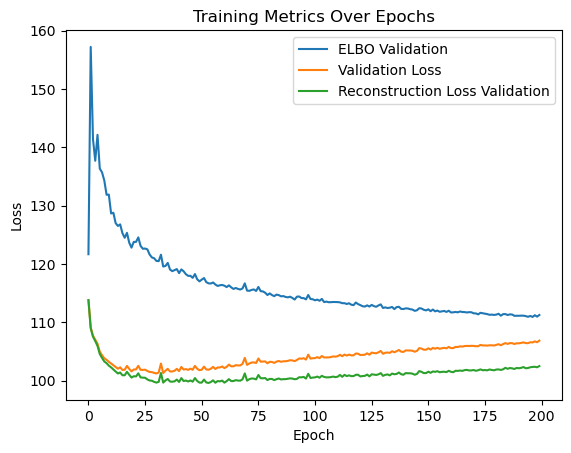

In [74]:
#Access the training history from the model
history = vae_lv15_nobatch.history

#Extract the metrics
elbo_validation = history['elbo_validation']
validation_loss = history['validation_loss']
reconstruction_loss_validation = history['reconstruction_loss_validation']

#Plot the metrics
#plt.figure(figsize=(10, 6))

#Plot ELBO validation
plt.plot(elbo_validation, label='ELBO Validation')

#Plot validation loss
plt.plot(validation_loss, label='Validation Loss')

#Plot reconstruction loss validation
plt.plot(reconstruction_loss_validation, label='Reconstruction Loss Validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Metrics Over Epochs')
plt.legend()
plt.show()


Note: 
Our scVI model converged successfully! 

1. We see an excellent convergence pattern with a rapid initial drop: All three metrics (ELBO, Validation Loss, Reconstruction Loss) show the expected steep decrease in the first ~20 epochs

2. Stabilization: All metrics plateau around epoch 50 & remain stable for the remainder of training. 

3. Final Values: ELBO ~248, Validation Loss ~240, Reconstruction Loss ~233


- Occasional Spikes: There are brief spikes around epochs 100 and 150, but the model quickly recovers to baseline
- Full 200 Epochs: Training used all allocated epochs rather than early stopping, but this is fine since metrics had stabilized

In [76]:
#Save the model from for future use: 
vae_lv15_nobatch.save("NEBC_scVI_model_nobatch_LV15_v2_06062025")

In [77]:
#After training, extract the latent representations
adata_filtered.obsm["X_scVI"] = vae_lv15_nobatch.get_latent_representation()
adata_filtered.obsm["X_normalized_scVI"] = vae_lv15_nobatch.get_normalized_expression()

#Proceed with dimensionality reduction & clustering (UMAP)
sc.pp.neighbors(adata_filtered, use_rep="X_scVI")
sc.tl.umap(adata_filtered, min_dist=0.3, maxiter=500)

<Figure size 400x400 with 0 Axes>

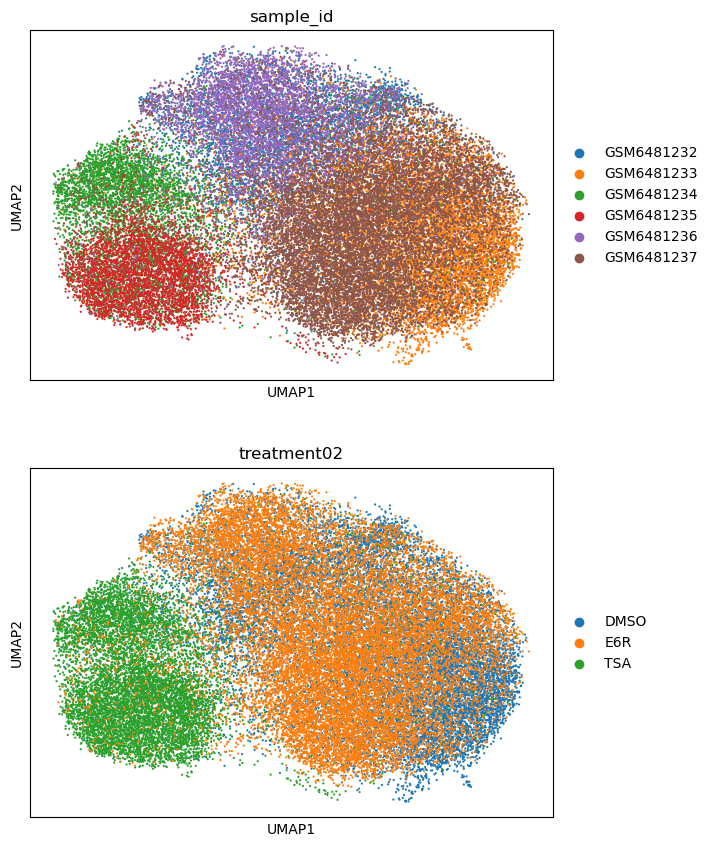

In [78]:
plt.figure(figsize=(4,4))
sc.pl.umap(adata_filtered, color=["sample_id", "treatment02"], ncols=1, size=10)

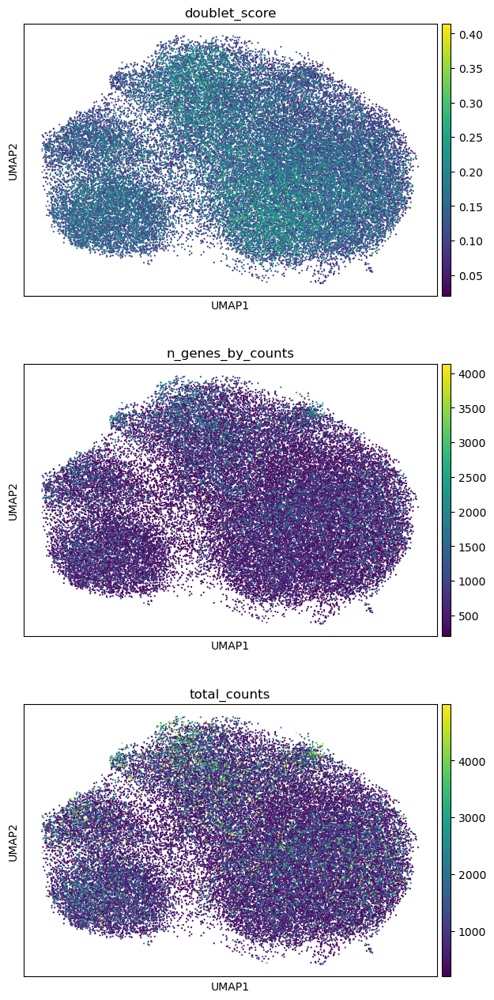

In [79]:
#Re-plot the QCs on UMAP:
sc.pl.umap(adata_filtered, color=['doublet_score', 'n_genes_by_counts', 'total_counts'], ncols=1, size=10)

2


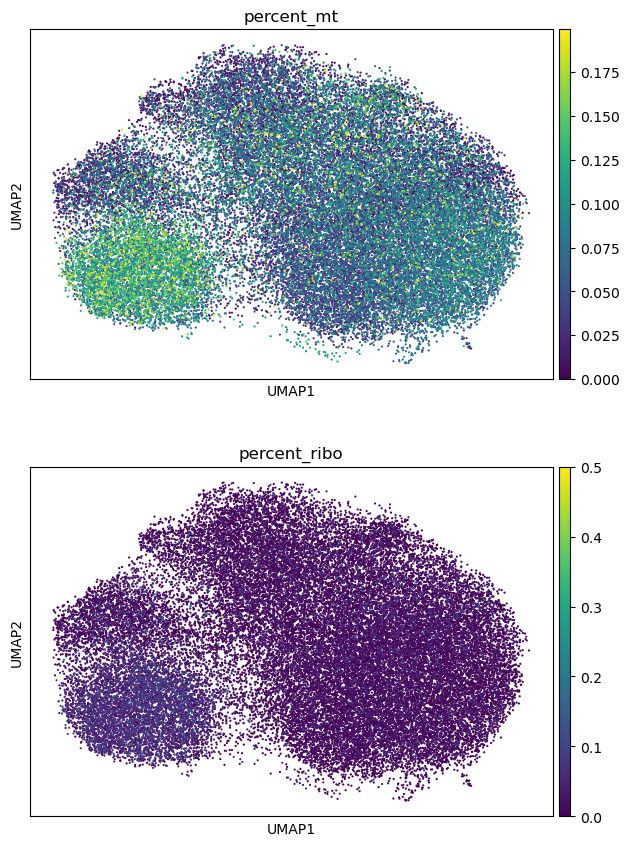

In [80]:
#Calculate %Ribo genes: 
ribo_genes = adata_filtered.var_names.str.startswith(("RPS","RPL"))
print(sum(ribo_genes))

adata_filtered.obs['percent_ribo'] = np.sum(
    adata_filtered[:, ribo_genes].X, axis=1).A1 / np.sum(adata_filtered.X, axis=1).A1

sc.pl.umap(adata_filtered, color=['percent_mt', 'percent_ribo'], ncols=1, size=10)

#Expected that TSA has high MT-activity but we should recheck the Sample ID => treatment mapping with Alex/Julien :)) 

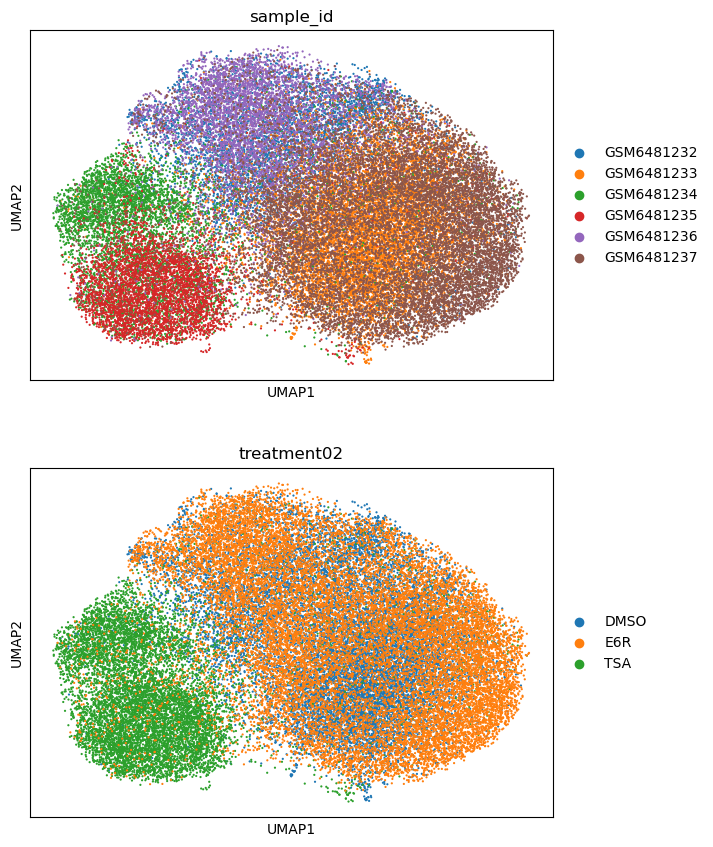

In [81]:
#Redo UMAP by increasing maxiter=1000 
sc.pp.neighbors(adata_filtered, use_rep="X_scVI")
sc.tl.umap(adata_filtered, min_dist=0.3, maxiter= 1000)
sc.pl.umap(adata_filtered, color=["sample_id", "treatment02"], ncols=1, size=10)

In [82]:
adata_filtered #final filtered anndata 

AnnData object with n_obs × n_vars = 40630 × 2000
    obs: 'treatment', 'replicate', 'sample_id', 'total_counts', 'n_genes_by_counts', 'percent_mt', 'treatment02', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'condition', 'outlier_MAD', 'genes_per_umi', 'log10_genes_per_umi', 'n_genes', 'doublet_score', 'predicted_doublet', '_scvi_batch', '_scvi_labels', 'percent_ribo'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'treatment02_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'predicted_doublet_colors', 'sample_id_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_uma

In [83]:
adata_filtered.write("./anndata_files/SKNBE2C_treated_scRNAseq_filtered_S0S1_20250606.h5ad")

In [84]:
#Extract the latent space from the scVI model
latent_space = vae_lv15_nobatch.get_latent_representation(adata_filtered)  

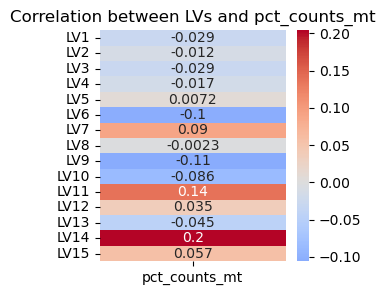

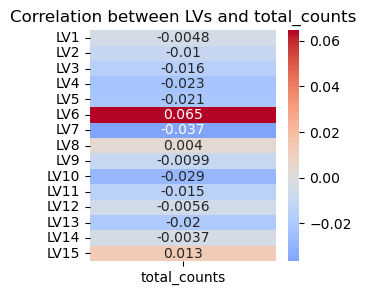

In [85]:
lv_df = pd.DataFrame(latent_space, columns=[f"LV{i+1}" for i in range(latent_space.shape[1])])
lv_df['pct_counts_mt'] = adata_filtered.obs['pct_counts_mt'].values
lv_df['total_counts'] = adata_filtered.obs['total_counts'].values

#Compute correlations
#drop(['pct_counts_mt', 'total_counts']) here is used to exclude the columns pct_counts_mt & total_counts from the final correlation matrix.
#removed to avoid unnecessary rows/columns with perfect correlations (1.0)
correlation_matrix_mt = lv_df.corr(method='pearson')['pct_counts_mt'].drop(['pct_counts_mt', 'total_counts'])
correlation_matrix_counts = lv_df.corr(method='pearson')['total_counts'].drop(['pct_counts_mt', 'total_counts'])

plt.figure(figsize=(3,3))
sns.heatmap(correlation_matrix_mt.to_frame(), annot=True, cmap='coolwarm', cbar=True, center=0)
plt.title('Correlation between LVs and pct_counts_mt')
plt.show()

plt.figure(figsize=(3,3))
sns.heatmap(correlation_matrix_counts.to_frame(), annot=True, cmap='coolwarm', cbar=True, center=0)
plt.title('Correlation between LVs and total_counts')
plt.show()

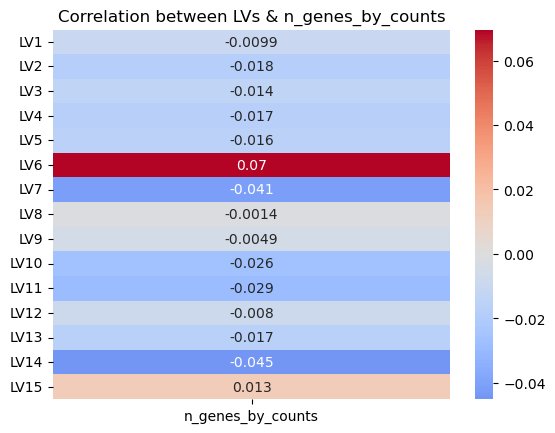

In [86]:
lv_df['n_genes_by_counts'] = adata_filtered.obs['n_genes_by_counts'].values

#Convert treatment condition to numerical values
lv_df['condition_numeric'] = pd.Categorical(adata_filtered.obs['condition']).codes
lv_df['treatment02_numeric'] = pd.Categorical(adata_filtered.obs['treatment02']).codes

#Now calculate the correlation matrix excluding the string fields
correlation_matrix_counts = lv_df.corr(method='pearson')['n_genes_by_counts'].drop(['n_genes_by_counts', 'condition_numeric', 'treatment02_numeric',
                                                                                   'pct_counts_mt', 'total_counts'])


sns.heatmap(correlation_matrix_counts.to_frame(), annot=True, cmap='coolwarm', cbar=True, center=0)
plt.title('Correlation between LVs & n_genes_by_counts')
plt.show()

/tmp/ipykernel_21117/282237910.py:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_filtered, resolution=res, random_state=0)


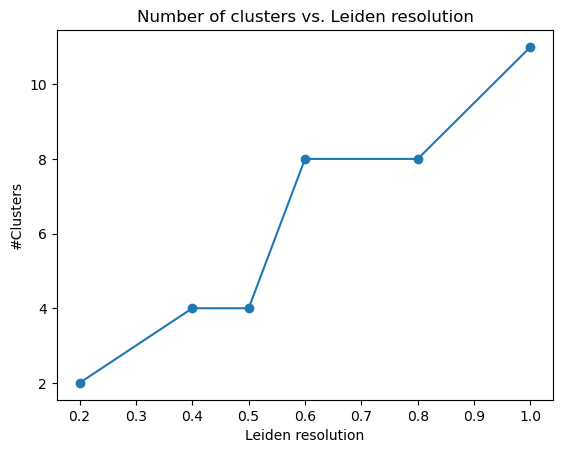

In [87]:
#Run Leiden clustering on batch corrected data: 

#Avoid res=1 or higher values as it'd surely over-cluster the data:

#Run Leiden clustering at different resolutions & number of clusters versus resolution: 
resolutions = [0.2, 0.4, 0.5, 0.6, 0.8, 1]
n_clusters = [] #store #clusters at each resolution 

for res in resolutions:
    sc.tl.leiden(adata_filtered, resolution=res, random_state=0)
    n_clusters.append(adata_filtered.obs['leiden'].nunique())

#Plot number of clusters versus resolution
plt.plot(resolutions, n_clusters, marker='o')
plt.xlabel("Leiden resolution")
plt.ylabel("#Clusters")
plt.title("Number of clusters vs. Leiden resolution")
plt.show()

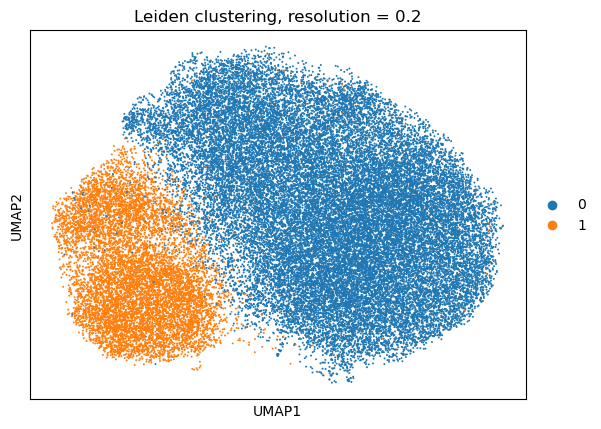

Silhouette Score at resolution 0.2: 0.40532535314559937


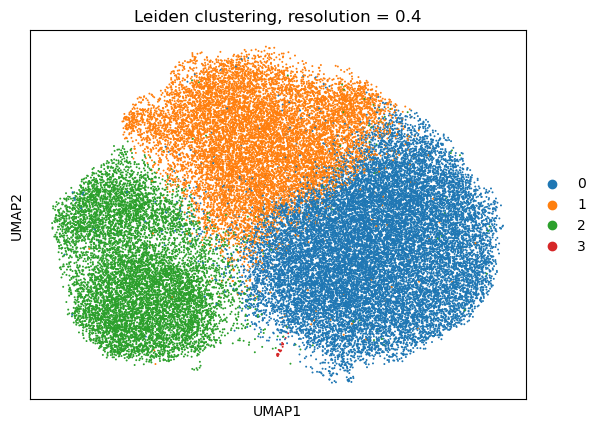

Silhouette Score at resolution 0.4: 0.2788146734237671


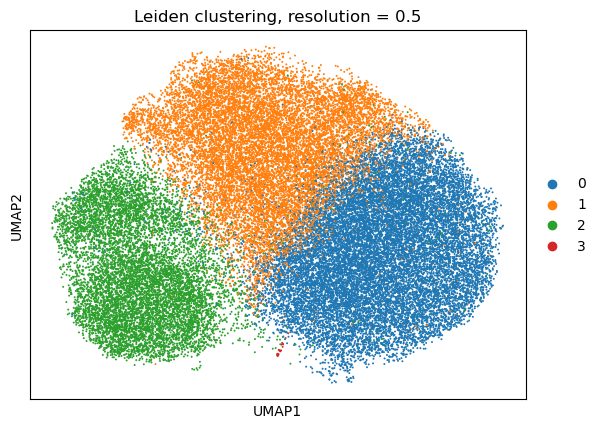

Silhouette Score at resolution 0.5: 0.27740660309791565


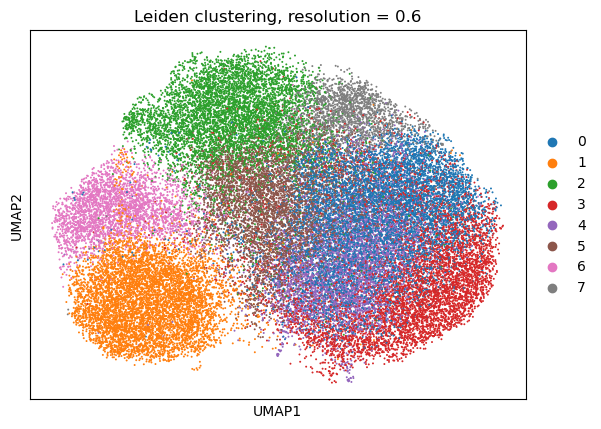

Silhouette Score at resolution 0.6: 0.15065346658229828


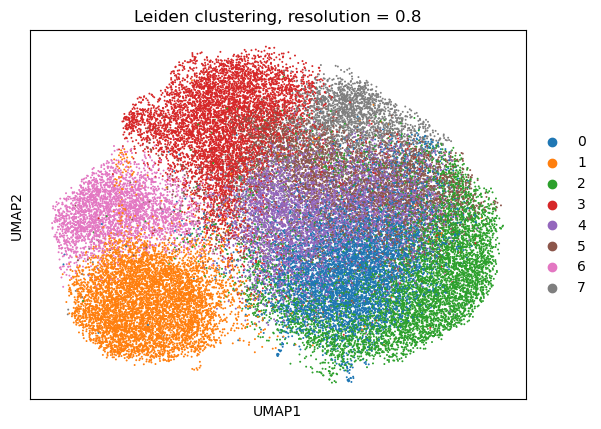

Silhouette Score at resolution 0.8: 0.149338498711586


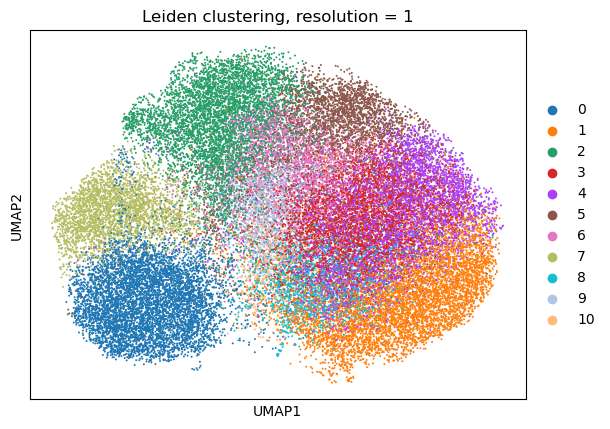

Silhouette Score at resolution 1: 0.11082395911216736


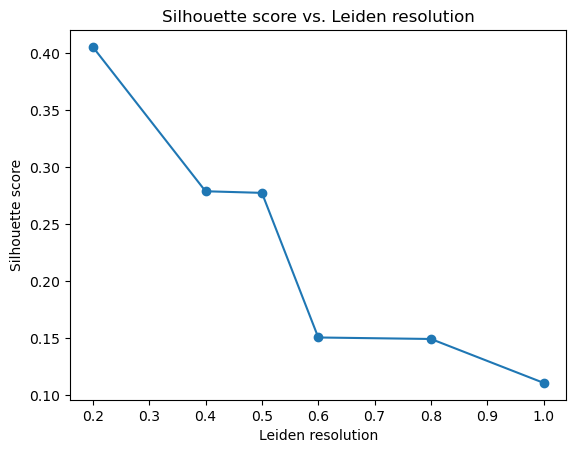

In [88]:
#Compute Silhouette score for Each resolution- a higher score indicates better-defined clusters.
from sklearn.metrics import silhouette_score

silhouette_scores = []

for res in resolutions:
    #Perform Leiden clustering for the given resolution
    sc.tl.leiden(adata_filtered, resolution=res)
    

    sc.pl.umap(adata_filtered, color='leiden', title=f"Leiden clustering, resolution = {res}", size=8)
    
    #Extract the Leiden labels from the adata object
    labels = adata_filtered.obs['leiden'].values
    embedding = adata_filtered.obsm['X_umap']  # Use UMAP embeddings for silhouette score calculation
    
    #Check if there is more than one unique label
    if len(set(labels)) > 1:
        silhouette_avg = silhouette_score(embedding, labels)
        silhouette_scores.append(silhouette_avg)
        print(f"Silhouette Score at resolution {res}: {silhouette_avg}")
    else:
        print(f"Only one label present at resolution {res}, skipping silhouette score calculation.")
        silhouette_scores.append(None)  # Add None or a placeholder for single-label cases

#Plot silhouette score versus resolution
plt.plot(resolutions, silhouette_scores, marker='o')
plt.xlabel("Leiden resolution")
plt.ylabel("Silhouette score")
plt.title("Silhouette score vs. Leiden resolution")
plt.show()

In [89]:
plt.figure(figsize=(4,4))

<Figure size 400x400 with 0 Axes>

<Figure size 400x400 with 0 Axes>

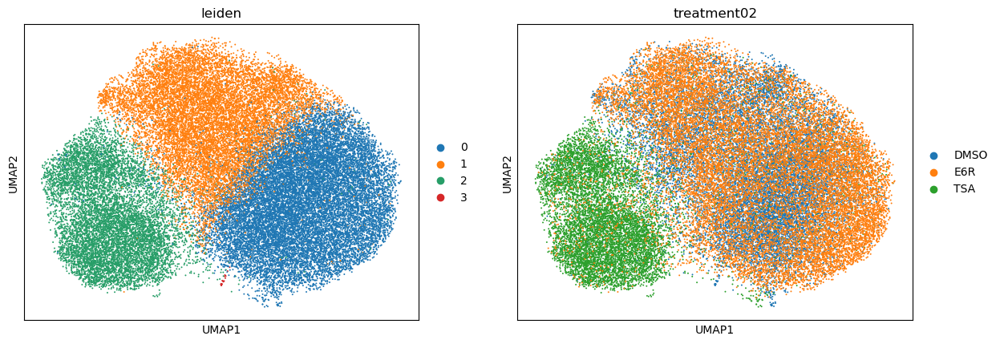

In [90]:
#Need to split the TSA clusters into two (like reso=0.6); to be covered in the _clustering notebook 
sc.tl.leiden(adata_filtered, resolution=0.5)
sc.pl.umap(adata_filtered, color= ['leiden', 'treatment02'], size=8)